## PUI 2016 Final Exam - jdg545

### Analysis of geographical differences in NYC. Compare different census data in 2000 and 2010 and how it changed.

### We will explore the diversity of NYC with choropleth maps to help us visualize the differences across neighborhoods.

In [697]:
#import packages
from __future__ import print_function
import pandas as pd
import json
import os
import pylab as pl
import matplotlib.pylab as plt
import geopandas as gpd
import glob
import zipfile
from sklearn.cluster import KMeans
from matplotlib import cm
from descartes import PolygonPatch
import scipy.cluster as scp
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster as scp
import pandas as pd
from pandas.io.common import ZipFile
import pylab as pl
from fiona.crs import from_epsg
from geopandas import GeoDataFrame
import ast
import urllib
import urllib2
from cStringIO import StringIO
import matplotlib.colors as mcolors
from scipy.cluster.vq import whiten
import shapely

%pylab inline
%matplotlib inline

PUIDATA=os.getenv('PUIDATA')
path = os.getenv('PUIDATA')+'/'

Populating the interactive namespace from numpy and matplotlib


## 1. Download business datasets for 2000 and 2010

In [698]:
# 1.
# download the 2000 and 2010 business datasets
#!wget ftp://ftp.census.gov/Econ2001_And_Earlier/CBP_CSV/zbp00totals.zip

In [699]:
#!wget ftp://ftp.census.gov/econ2010/CBP_CSV/zbp10totals.zip

In [700]:
#move them to PUIDATA

#!mv *.zip $PUIDATA

In [701]:
#convert to data frame
fname = "zbp10totals.zip"
zf = zipfile.ZipFile(path + fname)
df2010 = pd.read_csv(zf.open(fname.replace('.zip','.txt')))

fname = "zbp00totals.zip"
zf = zipfile.ZipFile(path + fname)
df2000 = pd.read_csv(zf.open(fname.replace('.zip','.txt')))

In [702]:
df2010['2010_est'] = df2010['est']
df2000['2000_est'] = df2000['EST']
df2000['zip'] = df2000['ZIP']

In [703]:
#merge 2000 and 2010
biz = pd.merge(df2010, df2000, on='zip', how='right')

In [704]:
#select columns needed
biz = biz[['zip', '2000_est', '2010_est']]

In [705]:
#clean up zip column
biz['zip'] = pd.to_numeric(biz['zip'], errors = 'coerce')
biz['zip'] = biz['zip'].astype(int)

## 2. Download NYC shapefile to plot the business data

In [49]:
#2.
#get nyc shapefile
!curl -O "https://raw.githubusercontent.com/fedhere/PUI2016_fb55/master/HW11_fb55/nyc-zip-code-tabulation-areas-polygons.geojson"
shapefile="nyc-zip-code-tabulation-areas-polygons.geojson"
os.system("mv " + shapefile + " " + os.getenv("PUIDATA"))
shapefile = PUIDATA +"/nyc-zip-code-tabulation-areas-polygons.geojson"

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  591k  100  591k    0     0  2633k      0 --:--:-- --:--:-- --:--:-- 7130k


In [706]:
shapes = gp.read_file(shapefile)
shapes = shapes.drop_duplicates(['postalCode'], keep = 'first')

In [707]:
#Merge business data with shapefile
shapes.rename(columns = {'postalCode': 'zip'}, inplace=True)
shapes['zip'] = pd.to_numeric(shapes['zip'], errors = 'coerce')
nyc_est = pd.merge(biz, shapes, on='zip', how='right')

## 3. Find the business density per square mile

In [708]:
# convert area from square feet to square miles 
nyc_est['area'] = nyc_est['Shape_Area'] / (2.788*10**7)

In [709]:
#calculate density for 2000 and 2010 with log10 to better visualize
nyc_est['2000_density'] = log10(nyc_est['2000_est'] / nyc_est['area'])
nyc_est['2010_density'] = log10(nyc_est['2010_est'] / nyc_est['area'])
nyc_est['diff_density'] = nyc_est['2010_density'] - nyc_est['2000_density']

In [710]:
#convert to GeoDataFrame
nyc_gdf = GeoDataFrame(nyc_est, geometry=nyc_est['geometry'])
nyc_gdf = nyc_gdf.set_index('zip')

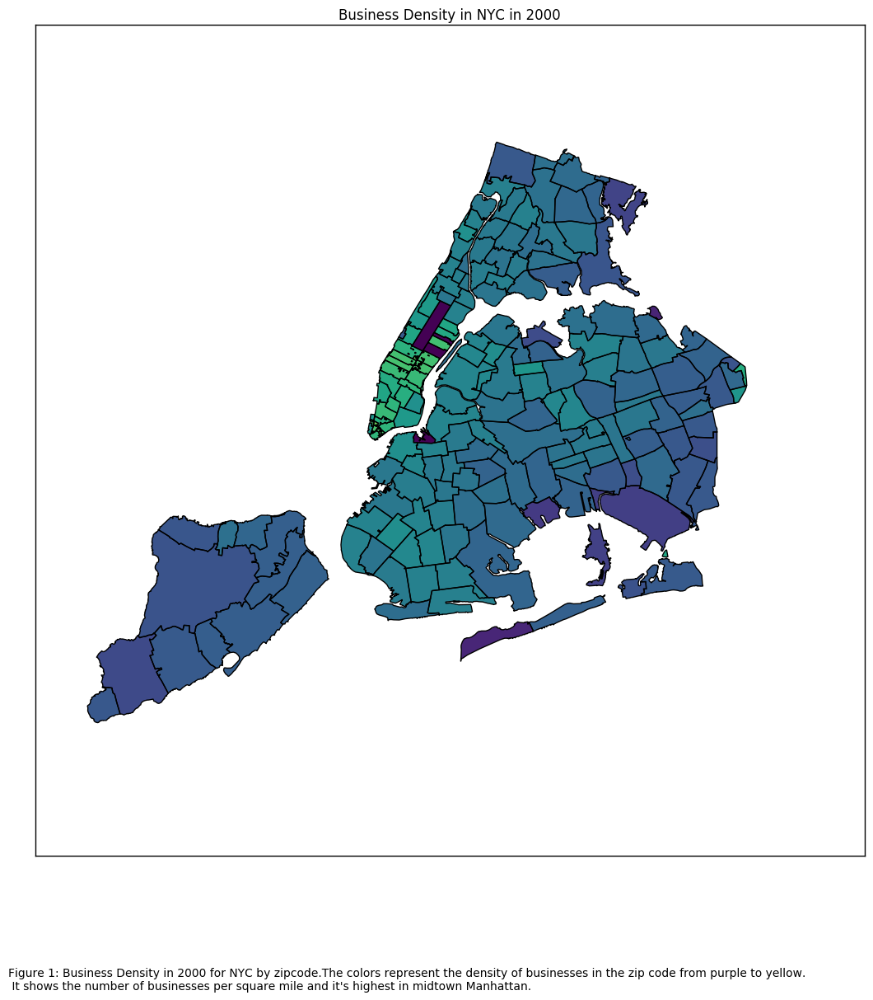

In [711]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
nyc_gdf.plot(column ='2000_density', colormap ='viridis', alpha = 1, linewidth = 1, ax = ax)
pl.title("Business Density in NYC in 2000")
pl.figtext(0.1,0,"Figure 1: Business Density in 2000 for NYC by zipcode."
"The colors represent the density of businesses in the zip code from purple to yellow.\n It shows the number of businesses per"
" square mile and it's highest in midtown Manhattan.")

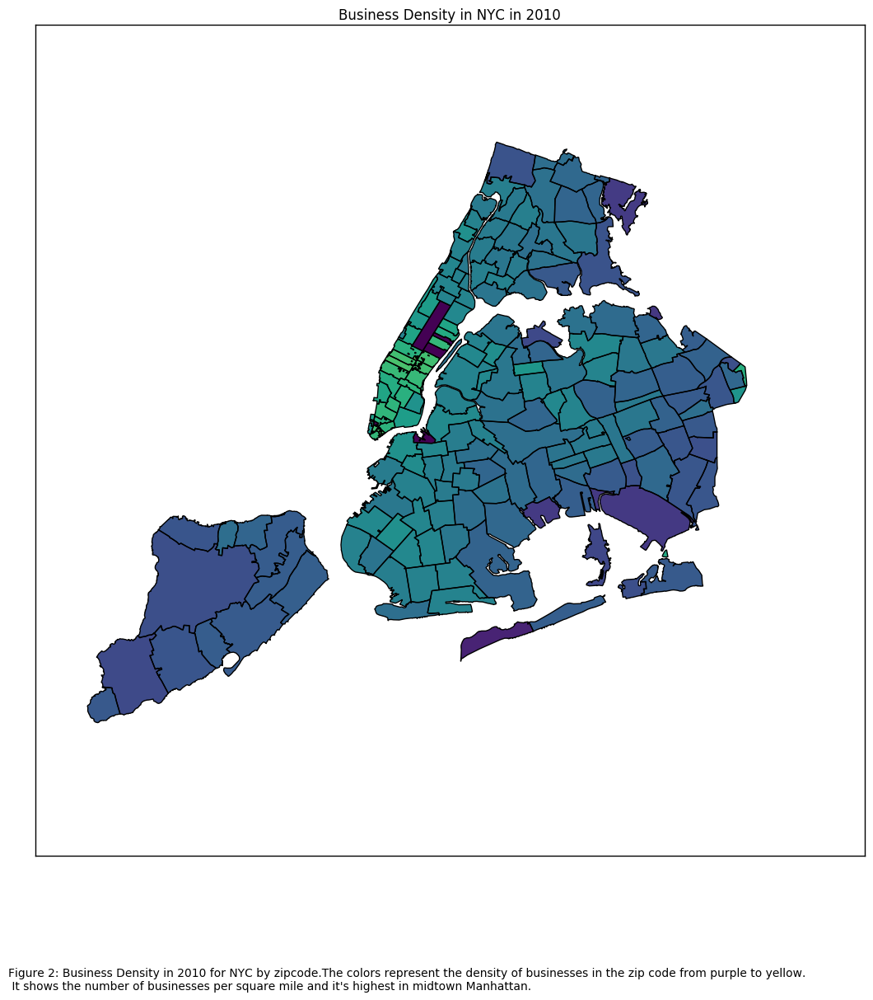

In [712]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
nyc_gdf.plot(column ='2010_density', colormap ='viridis', alpha = 1, linewidth = 1, ax = ax)
pl.title("Business Density in NYC in 2010")
pl.figtext(0.1,0,"Figure 2: Business Density in 2010 for NYC by zipcode."
"The colors represent the density of businesses in the zip code from purple to yellow.\n It shows the number of businesses per"
" square mile and it's highest in midtown Manhattan.")

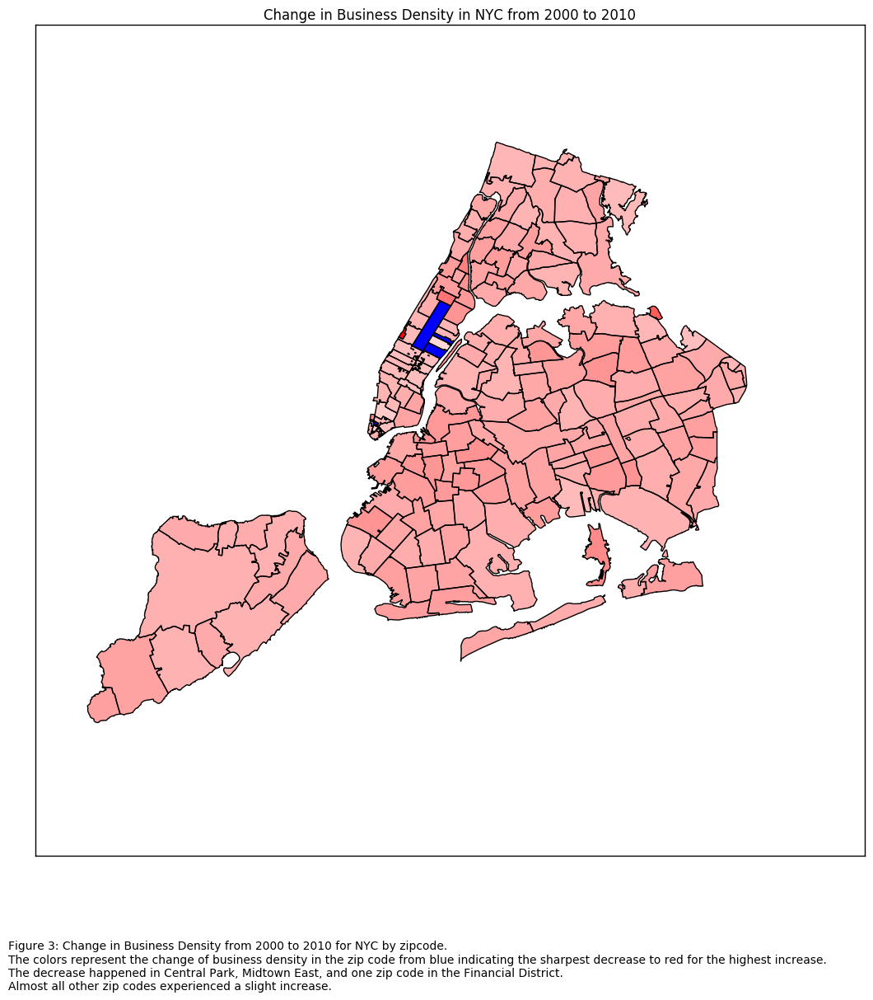

In [713]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
nyc_gdf.plot(column ='diff_density', colormap ='bwr', alpha = 1, linewidth = 1, ax = ax)
pl.title("Change in Business Density in NYC from 2000 to 2010")
pl.figtext(0.1,0,"Figure 3: Change in Business Density from 2000 to 2010 for NYC by zipcode.\n"
"The colors represent the change of business density in the zip code from blue indicating the sharpest decrease "
"to red for the highest increase. \n"
"The decrease happened in Central Park, Midtown East, and one zip code in the Financial District. \n"
"Almost all other zip codes experienced a slight increase.")

### The plots above are very uniform because the range from min to max is quite large. It would probably be helpful to split them into quantiles and plot the quantiles. This would take care of the outliers.

## 4. Collect Census Data by Census Tract

In [714]:
#Download the census and income data from Federica's CartoDB account

SQL_SOURCE = 'https://fb55.cartodb.com/api/v2/sql'

def queryCartoDB(query, format='CSV', source=SQL_SOURCE):
    """queries data from CartoDB SQL database
    Arguments:
    query: a string like 
            SELECT colum_name_1, column_name_2 FROM database_name
    format: the file format (e.g. CSV, GeoJson)
    source: the sql database url link
    Return:
        database as a string to be read in with the appropriate function
    """
    data = urllib.urlencode({'format': format, 'q': query})
    try:
        response = urllib2.urlopen(source, data)
    except urllib2.HTTPError, e:
        raise ValueError('\n'.join(ast.literal_eval(e.readline())['error']))
    except Exception:
        raise
    return StringIO(response.read())

# call as:
#datastream = queryCartoDB(query, format='CSV')
#data       = pd.read_csv(database_name)


In [715]:
#download the census data from 2000
#Used the metadata explained here to find column for median income: 
#http://cosmo.nyu.edu/~fb55/PUI2016/data/

censusQuery2000 = '''
SELECT geo_display_label, geo_id, hc01_vc01, hc01_vc18, hc02_vc29
FROM dec_00_sf1_dp1
GROUP BY geo_display_label, geo_id, hc01_vc01, hc01_vc18, hc02_vc29
'''

# Use the queryCartoDB helper function to retreive the data in JSON format
# Parse the JSON into a string and load it into a pandas dataframe
facilityStream = queryCartoDB(censusQuery2000, format='JSON', source=SQL_SOURCE)
facilityData   = json.loads(facilityStream.read())
census2000     = pd.DataFrame.from_dict(facilityData['rows'])

In [716]:
#census2000
census2000 = census2000.rename(
    columns={'hc01_vc01': 'population2000', 'hc01_vc18': 'median_age2000', 'hc02_vc29': 'pct_white2000'})

In [718]:
#Add Non White column to represent percent of diversity
census2000['pct_white2000'] = pd.to_numeric(census2000['pct_white2000'], errors = 'coerce')
census2000['non_white2000'] = 100 - census2000['pct_white2000']

# Drop NaN values
census2000 = census2000.dropna()

In [719]:
#download the census data from 2010
#Used the metadata explained here to find column for median income: 
#http://cosmo.nyu.edu/~fb55/PUI2016/data/

censusQuery2010 = '''
SELECT geo_display_label, geo_id, hd01_s001, hd01_s020, hd02_s078
FROM dec_10_sf1_sf1dp1
GROUP BY geo_display_label, geo_id, hd01_s001, hd01_s020, hd02_s078
'''

# Use the queryCartoDB helper function to retreive the data in JSON format
# Parse the JSON into a string and load it into a pandas dataframe
facilityStream = queryCartoDB(censusQuery2010, format='JSON', source=SQL_SOURCE)
facilityData   = json.loads(facilityStream.read())
census2010     = pd.DataFrame.from_dict(facilityData['rows'])

In [720]:
census2010 = census2010.rename(
    columns={'hd01_s001': 'population2010', 'hd01_s020': 'median_age2010', 'hd02_s078': 'pct_white2010'})

In [721]:
#Add Non White column to represent percent of diversity
census2010['pct_white2010'] = pd.to_numeric(census2010['pct_white2010'], errors = 'coerce')
census2010['non_white2010'] = 100 - census2010['pct_white2010']

#drop NaN values
census2010 = census2010.dropna()


## 5. Download the income data by census tract for 2000 and 2010.

In [722]:
#Download Income Data from 2000 from Federica's cartoDB
#Used the metadata explained here to find column for median income: 
#https://www.coursehero.com/file/10419062/HW-7-census-problem-STATA/

incomeQuery2000 = '''
SELECT geo_id, hc01_vc86
FROM dec_00_sf3_dp3_with_ann
GROUP BY geo_id, hc01_vc86
'''

# Use the queryCartoDB helper function to retreive the data in JSON format
# Parse the JSON into a string and load it into a pandas dataframe
facilityStream = queryCartoDB(incomeQuery2000, format='JSON', source=SQL_SOURCE)
facilityData   = json.loads(facilityStream.read())
income2000     = pd.DataFrame.from_dict(facilityData['rows'])

In [723]:
#clean the column names and remove NaN and zero values
income2000 = income2000.rename(columns={'hc01_vc86': 'median_income2000'})
income2000['median_income2000'] = pd.to_numeric(income2000['median_income2000'], errors = 'coerce')
income2000 = income2000.dropna()
income2000 = income2000[(income2000.median_income2000 > 0)]


In [724]:
#Download Income Data from 2010 from Federica's cartoDB
#Used the metadata explained here to find column for median income: 
#http://www.christinafriedle.com/uploads/1/8/4/7/1847486/lab1_mappingcensusdata.doc

incomeQuery2010 = '''
SELECT geo_id, hc01_est_vc13
FROM acs_10_5yr_s1901_with_ann
GROUP BY geo_id, hc01_est_vc13
'''

# Use the queryCartoDB helper function to retreive the data in JSON format
# Parse the JSON into a string and load it into a pandas dataframe
facilityStream = queryCartoDB(incomeQuery2010, format='JSON', source=SQL_SOURCE)
facilityData   = json.loads(facilityStream.read())
income2010     = pd.DataFrame.from_dict(facilityData['rows'])

In [725]:
#clean the column names and remove NaN and zero values
income2010 = income2010.rename(columns={'hc01_est_vc13': 'median_income2010'})
income2010['median_income2010'] = pd.to_numeric(income2010['median_income2010'], errors = 'coerce')
income2010 = income2010.dropna()
income2010 = income2010[(income2010.median_income2010 > 0)]

## 6. Merge the datasets 

In [727]:
#Merge income and census for 2000
CT2000 = pd.merge(census2000,  income2000, on='geo_id', how='inner')

In [728]:
#Merge income and census for 2010
CT2010 = pd.merge(census2010,  income2010, on='geo_id', how='inner')

## 7. Plot choropleths for every feature in 2000, 2010, and the difference

In [730]:
#Download census tract shapefile from 2010 from Federica's cartoDB

ctQuery = '''
SELECT boro_name, ct_2010, shape_area, shape_leng, the_geom
FROM table_2010_census_tracts
GROUP BY boro_name, ct_2010, shape_area, shape_leng, the_geom
'''

# Use the queryCartoDB helper function to retreive the data in JSON format
# Parse the JSON into a string and load it into a pandas dataframe
datastream = queryCartoDB(ctQuery, format='GeoJSON')
datageo  = json.loads(datastream.read())
ct_shape = gpd.GeoDataFrame.from_features(datageo['features'])

In [731]:
#Add County ID and concatenate with census tract to create geo_id column
#from Federica's Hints

countyID = {'Bronx':'005',
           'Manhattan':'061',
           'Staten Island':'085',
           'Brooklyn':'047',
           'Queens':'081'}

ct_shape['allcodes'] = list(zip(ct_shape.boro_name, ct_shape.ct_2010))
ct_shape['geo_id']  = ct_shape[['allcodes']].applymap(lambda x: 
                            ("1400000US36%03d%06d"%(int(countyID[x[0]]),int(x[1]))))

In [732]:
#Merge census datasets with shapefile
ct_2000 = pd.merge(CT2000, ct_shape, on='geo_id', how='inner')
ct_2010 = pd.merge(CT2010, ct_shape, on='geo_id', how='inner')

#merge both 2000 and 2010 for comparison
census = pd.merge(CT2000, CT2010, on='geo_id', how='inner')

In [733]:
#Convert to float in order to calculate the differences
census['population2000'] = pd.to_numeric(census['population2000'], errors = 'coerce')
census['population2010'] = pd.to_numeric(census['population2010'], errors = 'coerce')
census['diff_population'] = census.population2010 - census.population2000

census['median_age2000'] = pd.to_numeric(census['median_age2000'], errors = 'coerce')
census['median_age2010'] = pd.to_numeric(census['median_age2010'], errors = 'coerce')
census['diff_median_age'] = census.median_age2010 - census.median_age2000

census['diff_non_white'] = census.non_white2010 - census.non_white2000

census['median_income2000'] = pd.to_numeric(census['median_income2000'], errors = 'coerce')
census['median_income2010'] = pd.to_numeric(census['median_income2010'], errors = 'coerce')
census['diff_median_income'] = census.median_income2010 - census.median_income2000

In [734]:
#merge difference file with shapefile
ct_all = pd.merge(census, ct_shape, on='geo_id', how='inner')

In [735]:
#create geodataframes
ct_2000_gdf = GeoDataFrame(ct_2000, geometry=ct_2000['geometry'])
ct_2010_gdf = GeoDataFrame(ct_2010, geometry=ct_2010['geometry'])
ct_all_gdf = GeoDataFrame(ct_all, geometry=ct_all['geometry'])

### Plotting Population

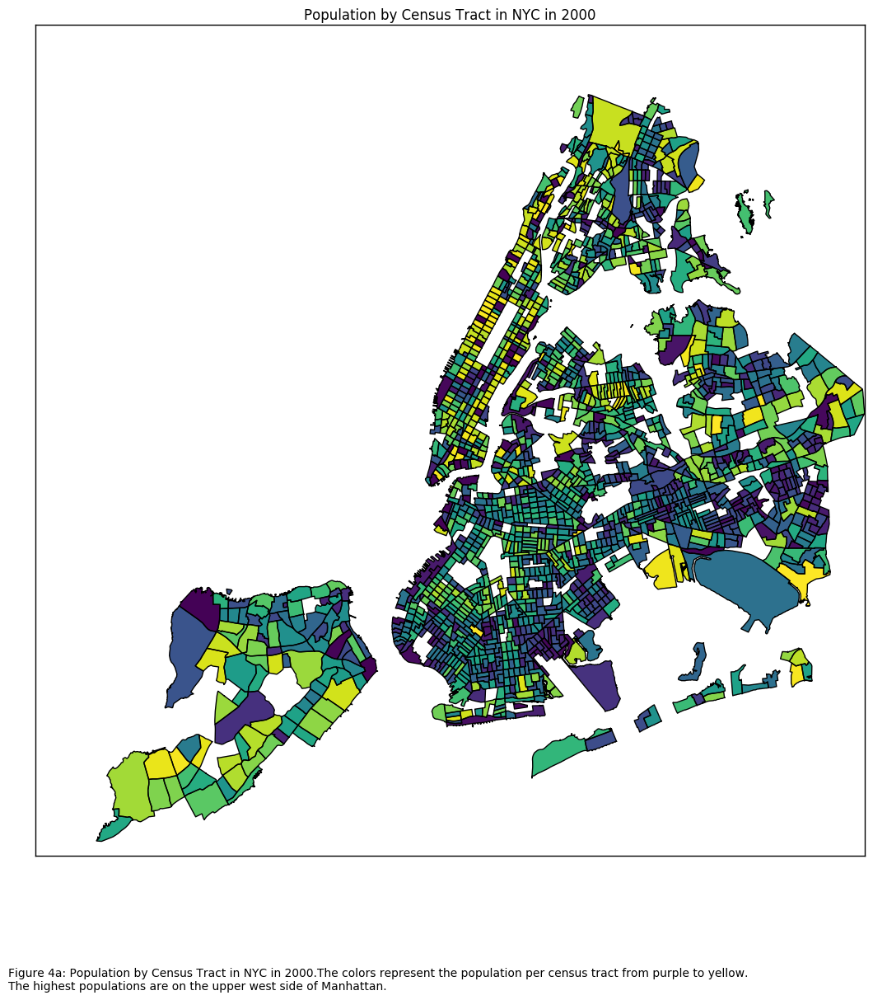

In [737]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ct_2000_gdf.plot(column ='population2000', colormap ='viridis', alpha = 1, linewidth = 1, ax = ax)

pl.title("Population by Census Tract in NYC in 2000")
pl.figtext(0.1,0,"Figure 4a: Population by Census Tract in NYC in 2000."
"The colors represent the population per census tract from purple to yellow. \n"
"The highest populations are on the upper west side of Manhattan."          )

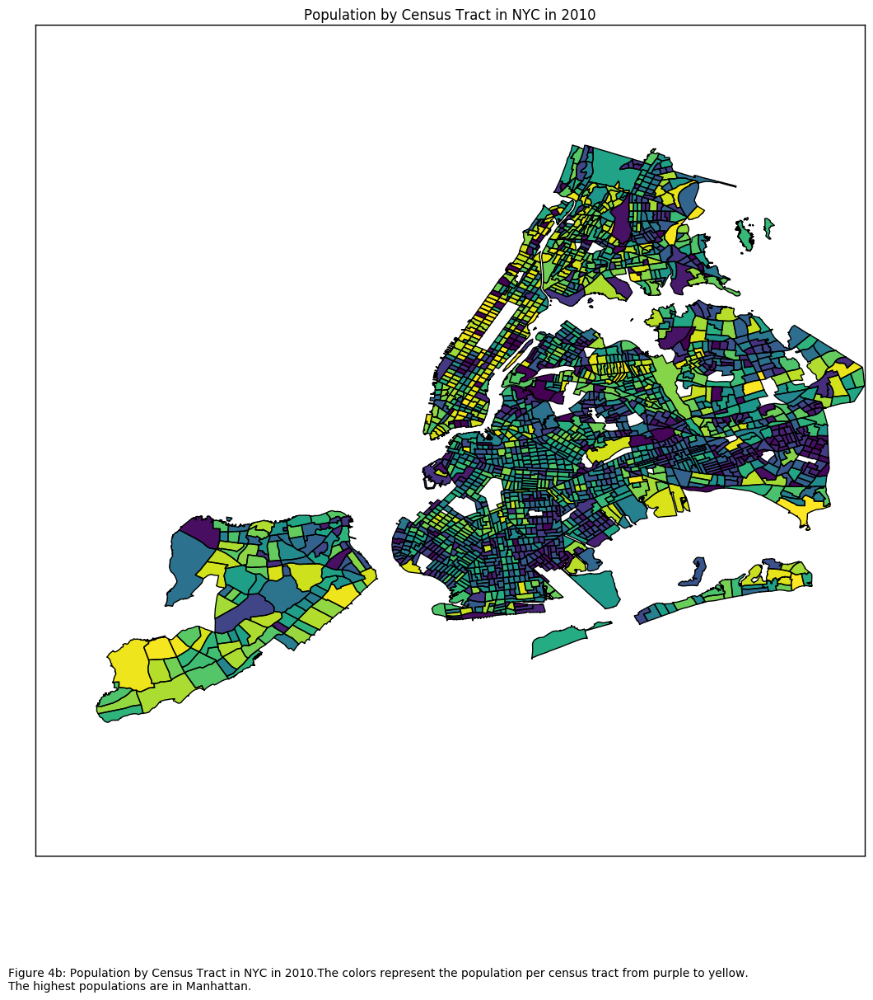

In [738]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ct_2010_gdf.plot(column ='population2010', colormap ='viridis', alpha = 1, linewidth = 1, ax = ax)

pl.title("Population by Census Tract in NYC in 2010")
pl.figtext(0.1,0,"Figure 4b: Population by Census Tract in NYC in 2010."
"The colors represent the population per census tract from purple to yellow. \n"
"The highest populations are in Manhattan."          )

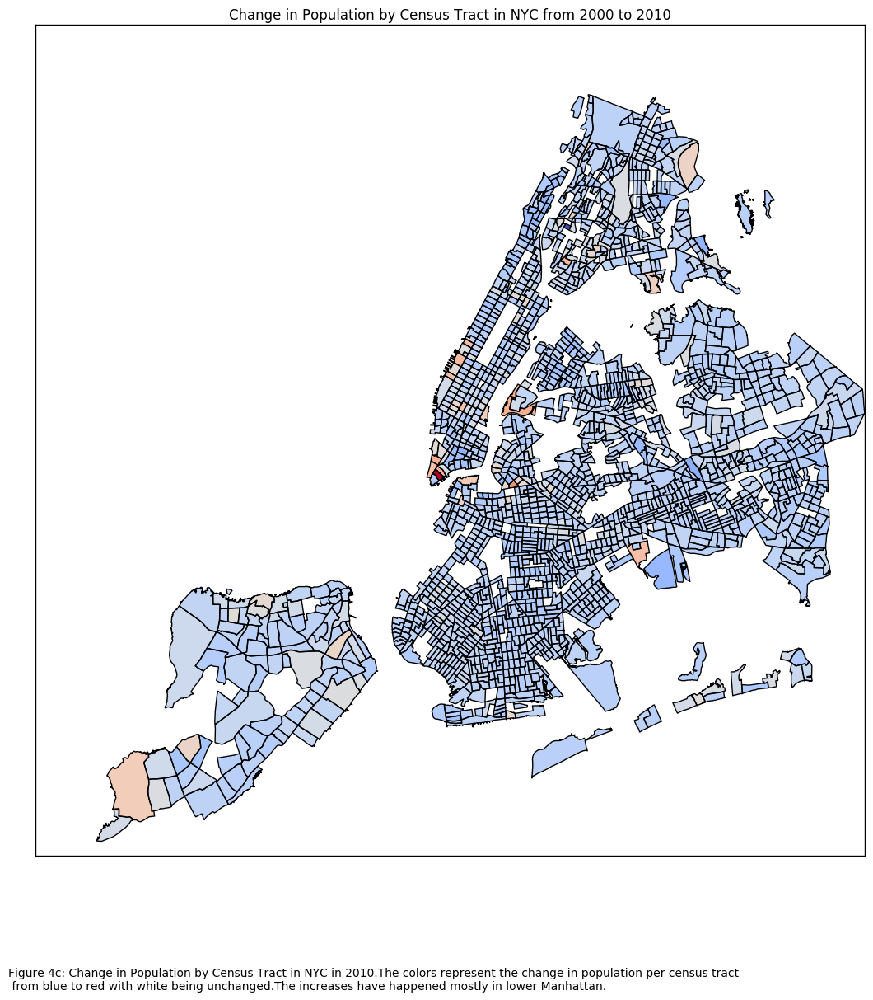

In [739]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ct_all_gdf.plot(column ='diff_population', colormap ='coolwarm', alpha = 1, linewidth = 1, ax = ax)

pl.title("Change in Population by Census Tract in NYC from 2000 to 2010")
pl.figtext(0.1,0,"Figure 4c: Change in Population by Census Tract in NYC in 2010."
"The colors represent the change in population per census tract \n from blue to red with white being unchanged."
"The increases have happened mostly in lower Manhattan."          )

#### These maps are based on the actual population by census tract and not the population density. This can be misleading since it's not adjusted for the geographical area of the census tract. Since census tracts are drawn to capture a comparable number of people, their size can vary a lot. For example, most census tracts in Staten Island have much lower population density than those in Manhattan but the population size could be the same. This analysis would be more complete with additional choropleths of the population density.

### Plotting Median Age

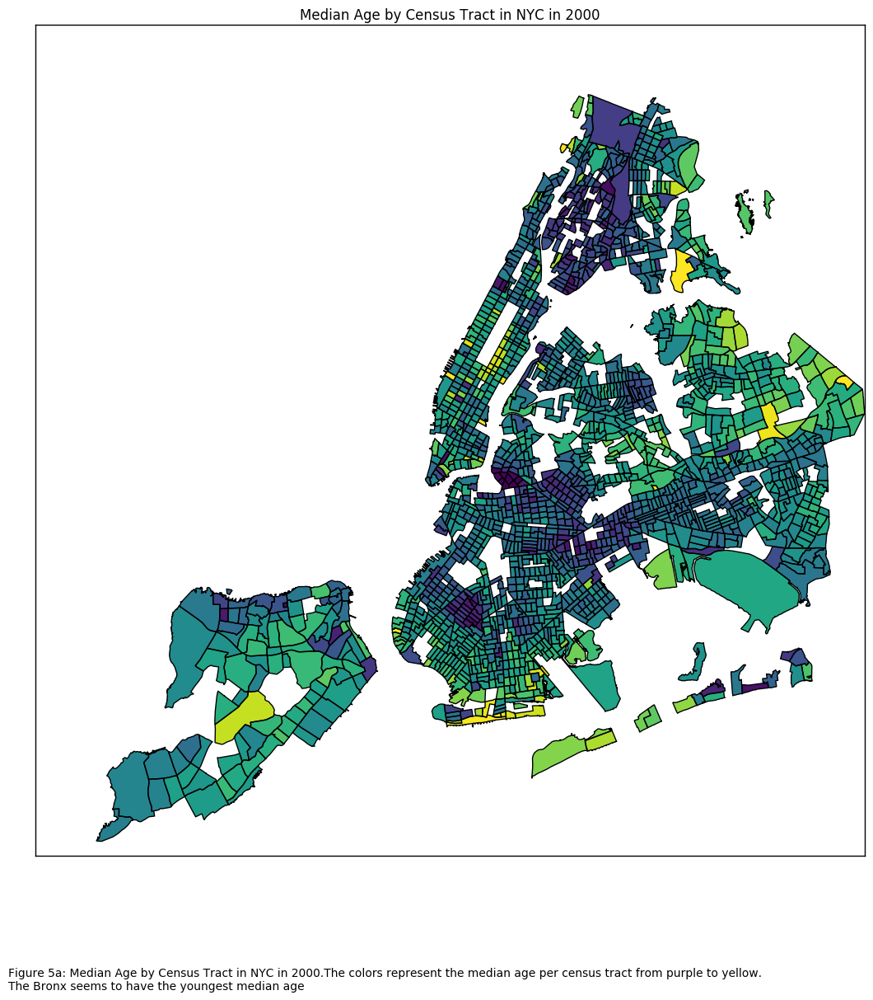

In [740]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ct_2000_gdf.plot(column ='median_age2000', colormap ='viridis', alpha = 1, linewidth = 1, ax = ax)

pl.title("Median Age by Census Tract in NYC in 2000")
pl.figtext(0.1,0,"Figure 5a: Median Age by Census Tract in NYC in 2000."
"The colors represent the median age per census tract from purple to yellow. \n"
"The Bronx seems to have the youngest median age")

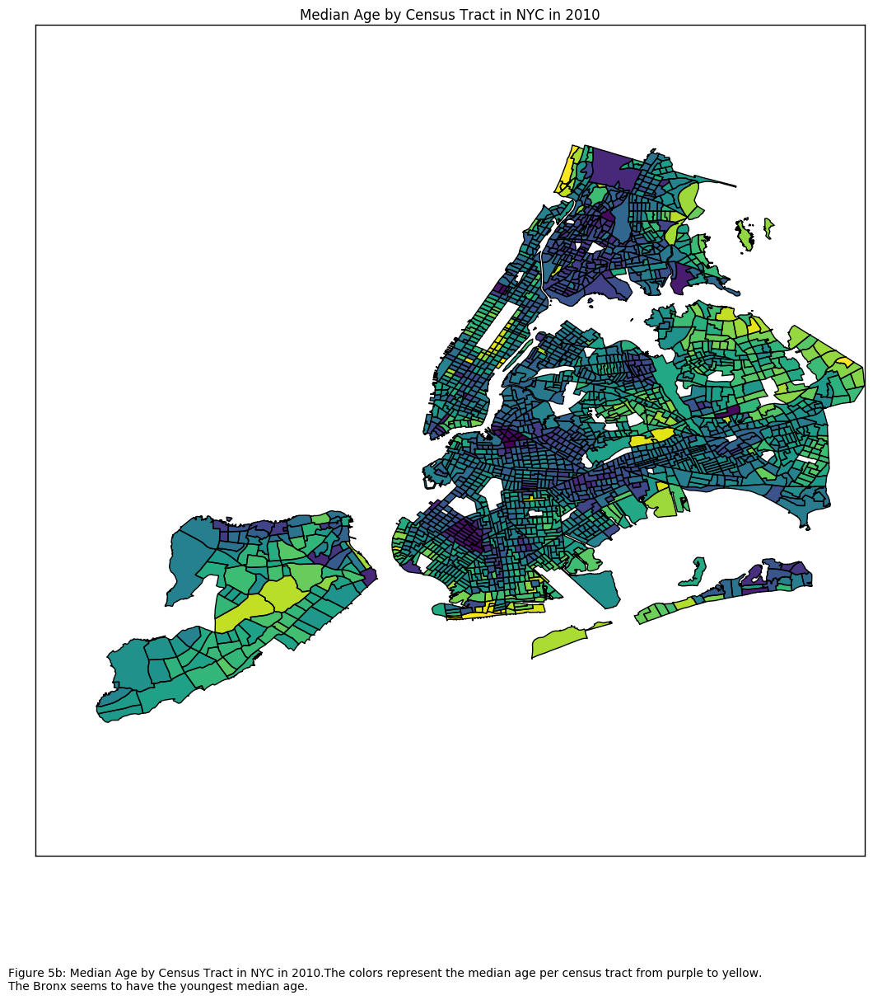

In [741]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ct_2010_gdf.plot(column ='median_age2010', colormap ='viridis', alpha = 1, linewidth = 1, ax = ax)

pl.title("Median Age by Census Tract in NYC in 2010")
pl.figtext(0.1,0,"Figure 5b: Median Age by Census Tract in NYC in 2010."
"The colors represent the median age per census tract from purple to yellow. \n"
"The Bronx seems to have the youngest median age.")

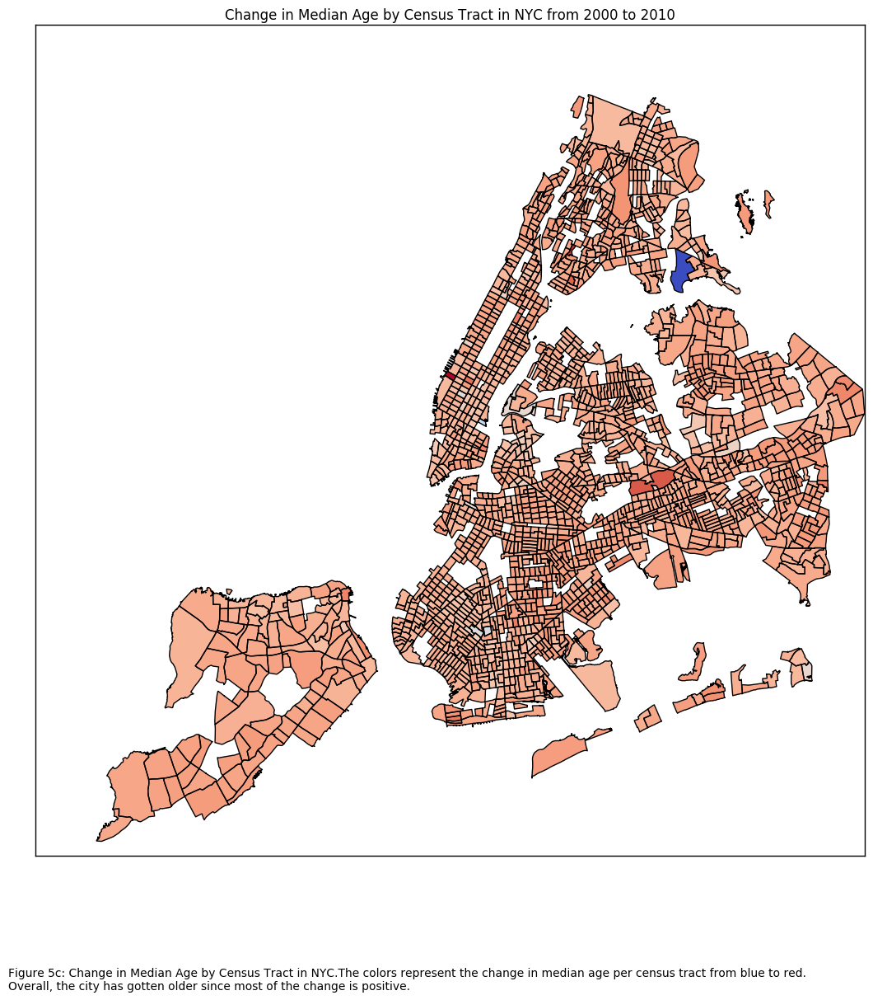

In [742]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ct_all_gdf.plot(column ='diff_median_age', colormap ='coolwarm', alpha = 1, linewidth = 1, ax = ax)

pl.title("Change in Median Age by Census Tract in NYC from 2000 to 2010")
pl.figtext(0.1,0,"Figure 5c: Change in Median Age by Census Tract in NYC."
"The colors represent the change in median age per census tract from blue to red. \n"
"Overall, the city has gotten older since most of the change is positive.")

### Plotting Diversity

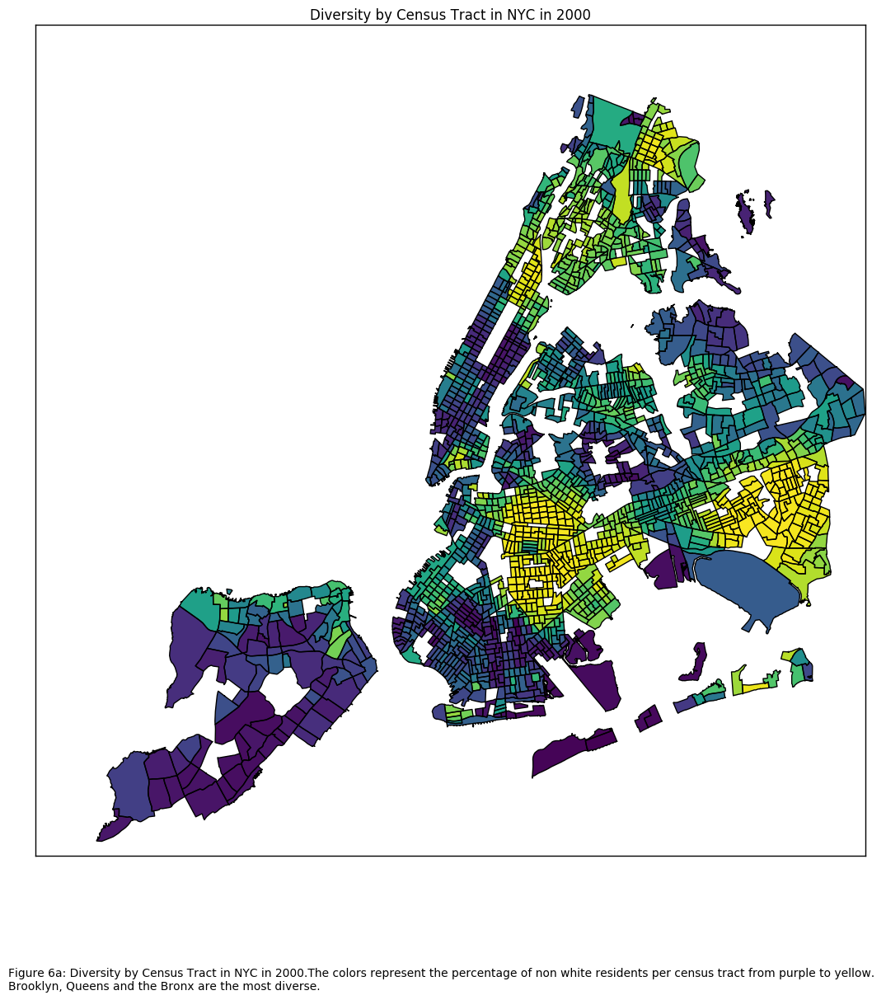

In [743]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ct_2000_gdf.plot(column ='non_white2000', colormap ='viridis', alpha = 1, linewidth = 1, ax = ax)

pl.title("Diversity by Census Tract in NYC in 2000")
pl.figtext(0.1,0,"Figure 6a: Diversity by Census Tract in NYC in 2000."
"The colors represent the percentage of non white residents per census tract from purple to yellow. \n"
"Brooklyn, Queens and the Bronx are the most diverse.")

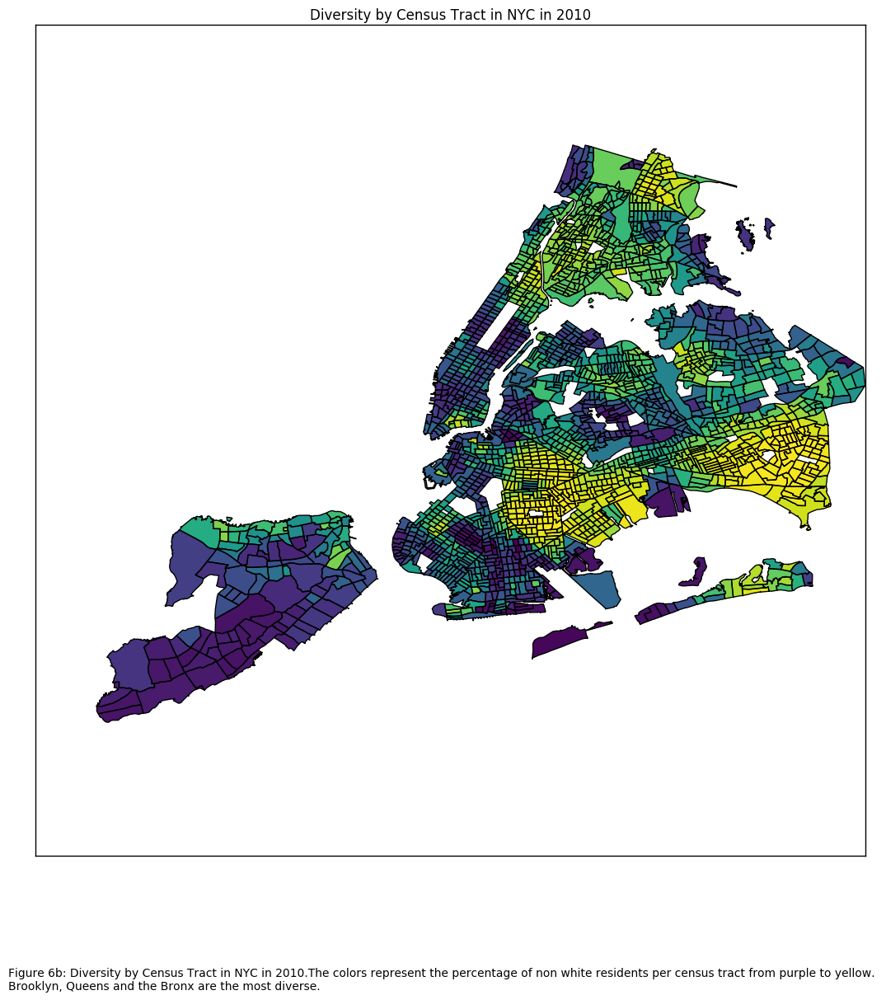

In [744]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ct_2010_gdf.plot(column ='non_white2010', colormap ='viridis', alpha = 1, linewidth = 1, ax = ax)

pl.title("Diversity by Census Tract in NYC in 2010")
pl.figtext(0.1,0,"Figure 6b: Diversity by Census Tract in NYC in 2010."
"The colors represent the percentage of non white residents per census tract from purple to yellow. \n"
"Brooklyn, Queens and the Bronx are the most diverse.")

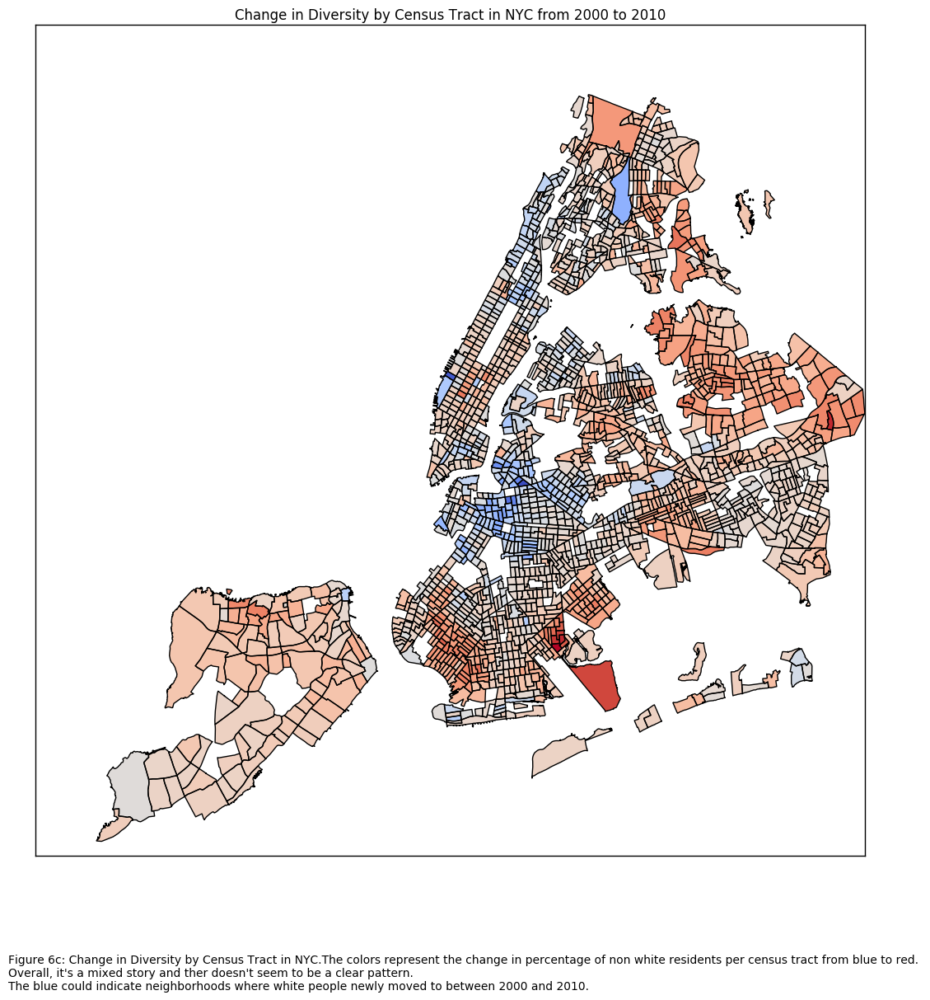

In [745]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ct_all_gdf.plot(column ='diff_non_white', colormap ='coolwarm', alpha = 1, linewidth = 1, ax = ax)

pl.title("Change in Diversity by Census Tract in NYC from 2000 to 2010")
pl.figtext(0.1,0,"Figure 6c: Change in Diversity by Census Tract in NYC."
"The colors represent the change in percentage of non white residents per census tract from blue to red. \n"
"Overall, it's a mixed story and ther doesn't seem to be a clear pattern.\n"
"The blue could indicate neighborhoods where white people newly moved to between 2000 and 2010.")

#### Diversity is probably the most loaded feature we are looking at in this analysis. There are many indicators that are corelated with the level of diversity of a neighborhood and we should not shy away from studying how it's changed and what we can learn about NYC from it. We should note that Percent White is an incomplete indicator of diversity. Indeed, a neighborhood that is 90% African American is actually less diverse than a neighborhood that is 40% white.

### Plotting Median Household Income

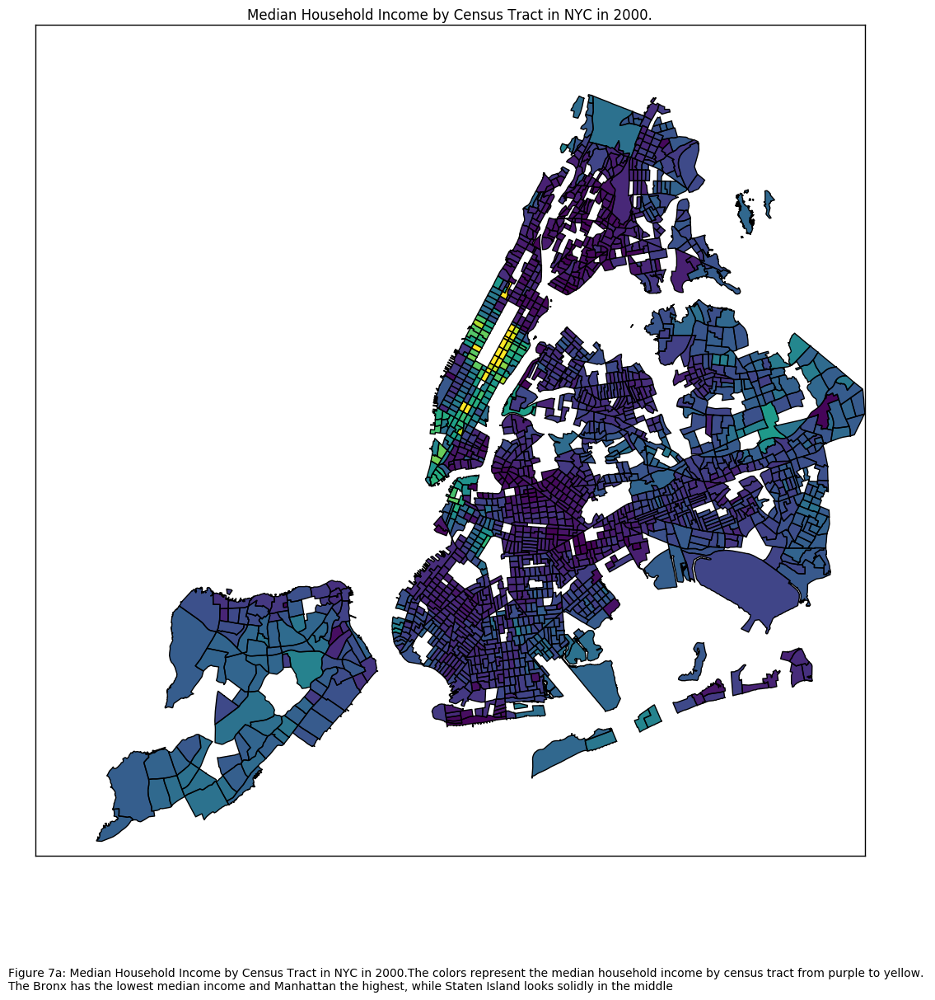

In [746]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ct_2000_gdf.plot(column ='median_income2000', colormap ='viridis', alpha = 1, linewidth = 1, ax = ax)

pl.title("Median Household Income by Census Tract in NYC in 2000.")
pl.figtext(0.1,0,"Figure 7a: Median Household Income by Census Tract in NYC in 2000."
"The colors represent the median household income by census tract from purple to yellow. \n"
"The Bronx has the lowest median income and Manhattan the highest, while Staten Island looks solidly in the middle")

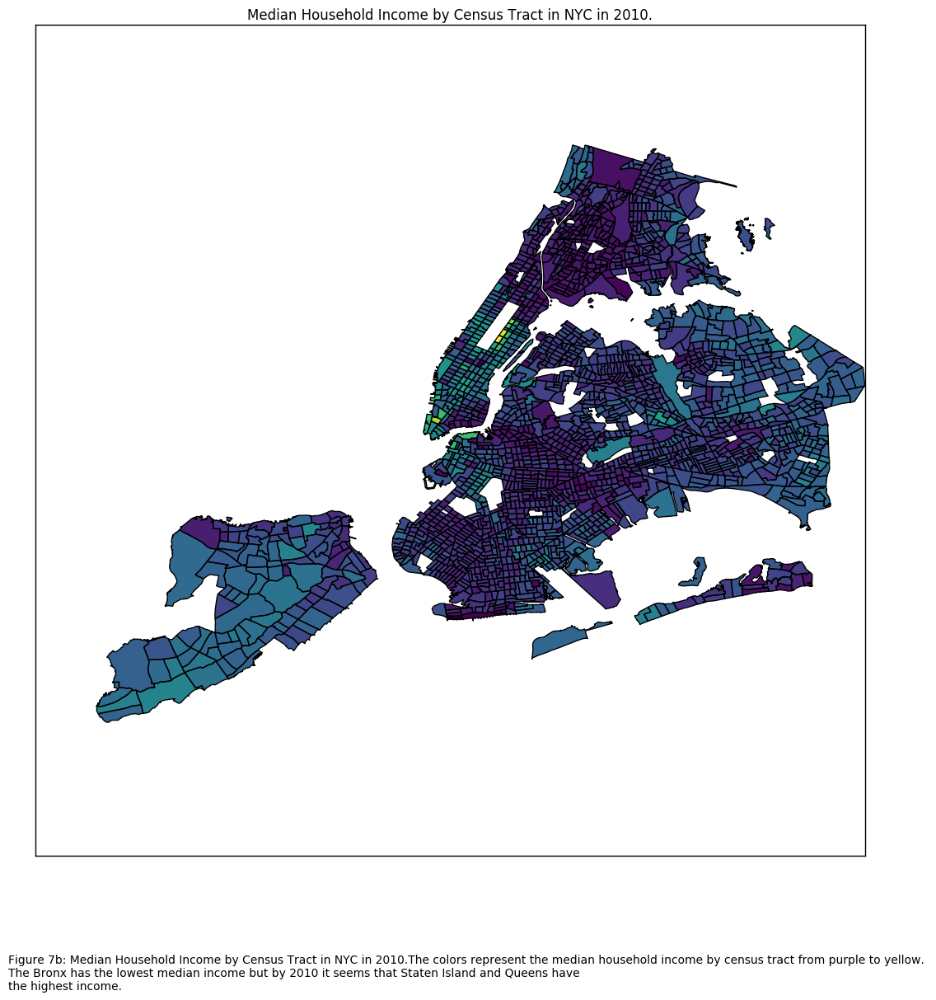

In [747]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ct_2010_gdf.plot(column ='median_income2010', colormap ='viridis', alpha = 1, linewidth = 1, ax = ax)

pl.title("Median Household Income by Census Tract in NYC in 2010.")
pl.figtext(0.1,0,"Figure 7b: Median Household Income by Census Tract in NYC in 2010."
"The colors represent the median household income by census tract from purple to yellow. \n"
"The Bronx has the lowest median income but by 2010 it seems that Staten Island and Queens have \n"
"the highest income.")

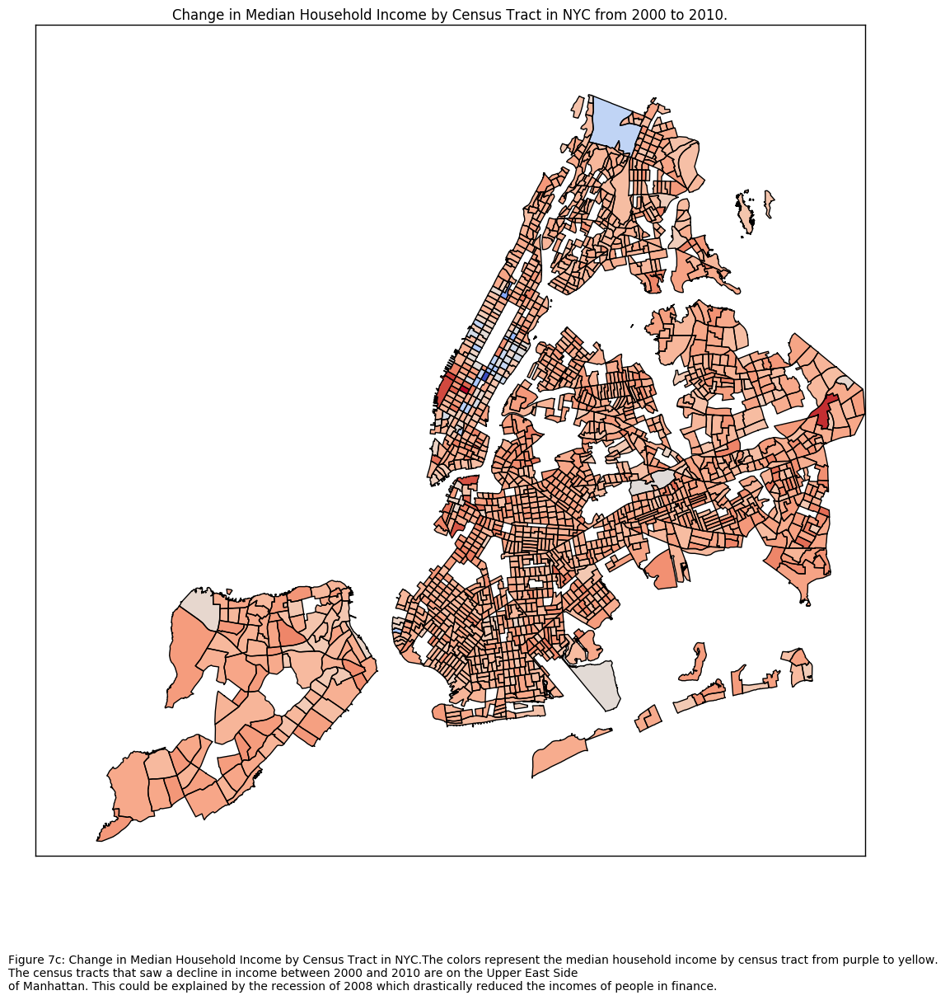

In [749]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ct_all_gdf.plot(column ='diff_median_income', colormap ='coolwarm', alpha = 1, linewidth = 1, ax = ax)

pl.title("Change in Median Household Income by Census Tract in NYC from 2000 to 2010.")
pl.figtext(0.1,0,"Figure 7c: Change in Median Household Income by Census Tract in NYC."
"The colors represent the median household income by census tract from purple to yellow. \n"
"The census tracts that saw a decline in income between 2000 and 2010 are on the Upper East Side \n"
"of Manhattan. This could be explained by the recession of 2008 which drastically reduced the incomes of people in finance.")

## 8. Cluster the census tracts on the four features

In [750]:
#Cluster the census tracts
#remove NaN values
clusters_2000 = ct_2000_gdf.dropna()
clusters_2010 = ct_2010_gdf.dropna()

In [751]:
#reset columns as floats for 2000
clusters_2000['population'] = clusters_2000.population2000.astype(float)
clusters_2000['age'] = clusters_2000.median_age2000.astype(float)
clusters_2000['non_white'] = clusters_2000.non_white2000.astype(float)
clusters_2000['income'] = clusters_2000.median_income2000.astype(float)

In [752]:
#reset columns as floats for 2010
clusters_2010['population'] = clusters_2010.population2010.astype(float)
clusters_2010['age'] = clusters_2010.median_age2010.astype(float)
clusters_2010['non_white'] = clusters_2010.non_white2010.astype(float)
clusters_2010['income'] = pd.to_numeric(clusters_2010['median_income2010'], errors = 'coerce')

In [753]:
clusters_2010 = clusters_2010.dropna()

In [760]:
#Whiten the data for 2000
clusters_2000['population'] = whiten(clusters_2000['population'])
clusters_2000['age'] = whiten(clusters_2000['age'])
clusters_2000['non_white'] = whiten(clusters_2000['non_white'])
clusters_2000['income'] = whiten(clusters_2000['income'])

In [754]:
columns = ['population', 'age', 'non_white', 'income']

In [759]:
#choose the number of clusters
#Using code from http://www.dummies.com/programming/big-data/data-science
#/how-to-visualize-the-clusters-in-a-k-means-unsupervised-learning-model/
nc = 5

#cluster    
km2000 = KMeans(n_clusters = nc, random_state = 444).fit(clusters_2000[columns])
clusters_2000['cluster'] = km2000.labels_

In [761]:
#Whiten the data for 2010
clusters_2010['population'] = whiten(clusters_2010['population'])
clusters_2010['age'] = whiten(clusters_2010['age'])
clusters_2010['non_white'] = whiten(clusters_2010['non_white'])
clusters_2010['income'] = whiten(clusters_2010['income'])

In [762]:
#choose the number of clusters
#Using code from http://www.dummies.com/programming/big-data/data-science
#/how-to-visualize-the-clusters-in-a-k-means-unsupervised-learning-model/
nc = 5

#cluster    
km2010 = KMeans(n_clusters = nc, random_state = 444).fit(clusters_2010[columns])
clusters_2010['cluster'] = km2010.labels_

## 9. Identify the census tracts that changed cluster and plot choropleth

In [763]:
#Merge clusters from 2000 and 2010 to determine if it changed
clusters_merged = pd.merge(clusters_2000, clusters_2010, on='geo_id', how='inner')

In [764]:
clusters_merged = clusters_merged.dropna()
clusters_merged.cluster_x = clusters_merged.cluster_x.astype(int)

In [765]:
clusters_merged['same'] = (clusters_merged['cluster_x'].values == clusters_merged['cluster_y'].values)

In [766]:
clusters_merged_gdf = GeoDataFrame(clusters_merged, geometry=clusters_merged['geometry_x'])

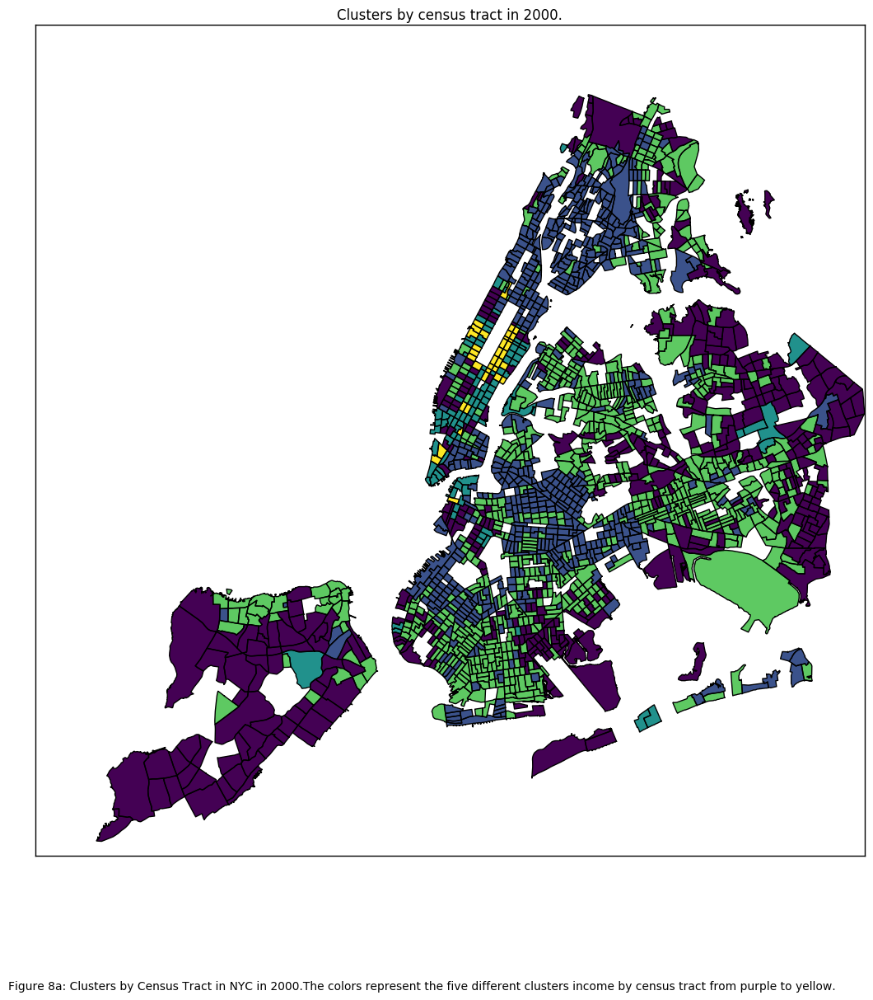

In [767]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)


#I commented it out because it was not displaying correctly

#cmap = mpl.cm.Blues
#norm = mpl.colors.Normalize(vmin=0, vmax=5)
#bounds = range(nc + 1)
#norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
#cb3 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap,
#                                norm=norm,
#                                ticks=bounds,
#                                spacing='uniform',
#                                orientation='horizontal')
#
#cb3.set_label('clusters', fontsize=30)
#ax = pl.figure(figsize=(15, 15)).add_subplot(111)

clusters_2000.plot(column ='cluster', colormap ='viridis', alpha = 1, linewidth = 1, ax = ax)
pl.title("Clusters by census tract in 2000.")
pl.figtext(0.1,0,"Figure 8a: Clusters by Census Tract in NYC in 2000."
"The colors represent the five different clusters income by census tract from purple to yellow.")

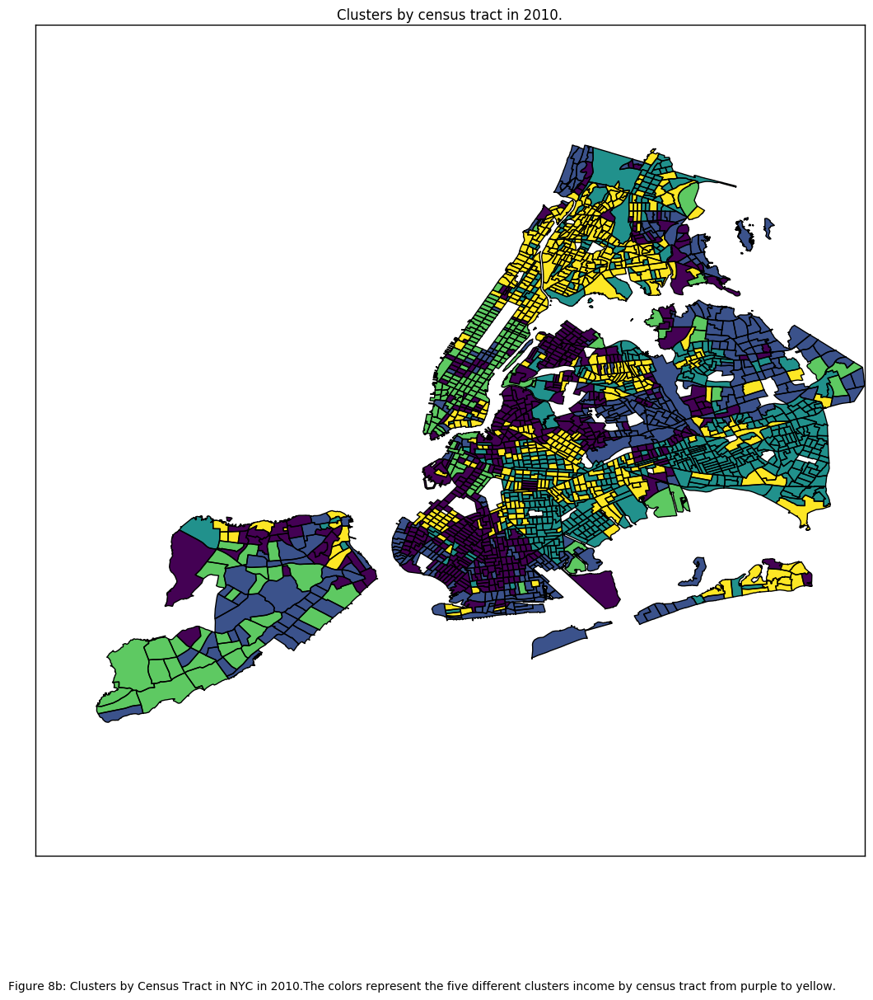

In [768]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

clusters_2010.plot(column ='cluster', colormap ='viridis', alpha = 1, linewidth = 1, ax = ax)
pl.title("Clusters by census tract in 2010.")
pl.figtext(0.1,0,"Figure 8b: Clusters by Census Tract in NYC in 2010."
"The colors represent the five different clusters income by census tract from purple to yellow.")

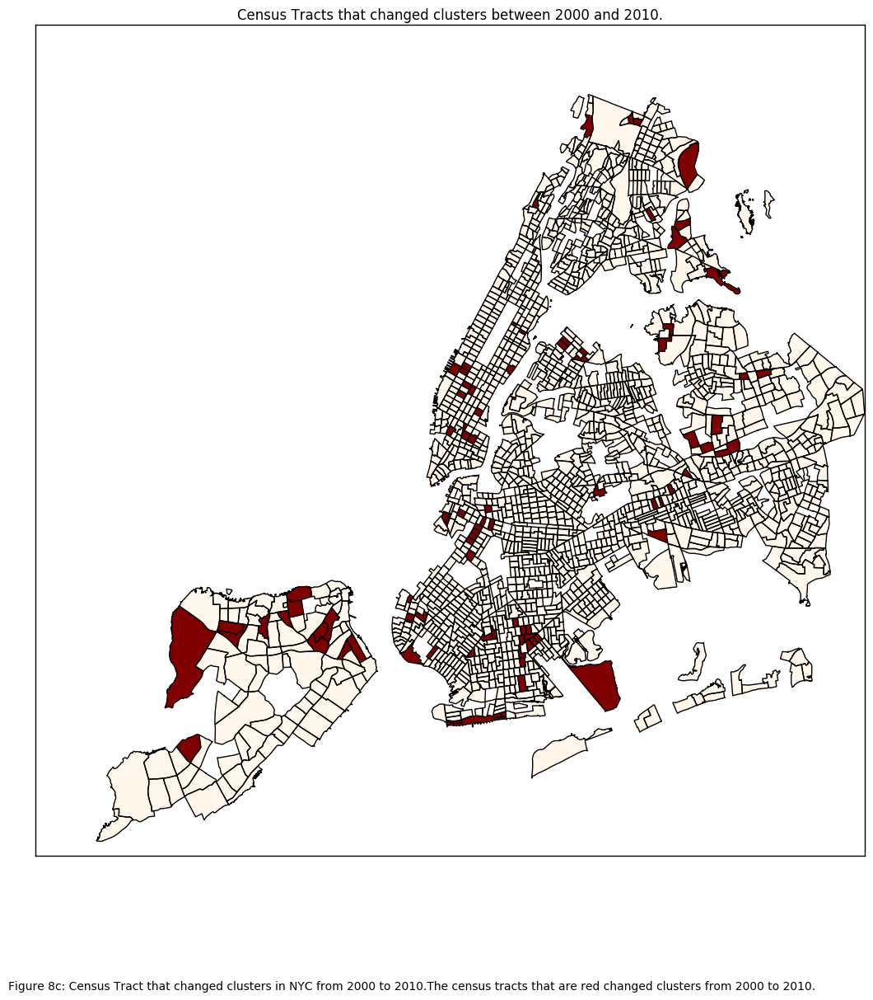

In [769]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

clusters_merged_gdf.plot(column ='same', colormap ='OrRd', alpha = 1, linewidth = 1, ax = ax)
pl.title("Census Tracts that changed clusters between 2000 and 2010.")
pl.figtext(0.1,0,"Figure 8c: Census Tract that changed clusters in NYC from 2000 to 2010."
"The census tracts that are red changed clusters from 2000 to 2010.")

#### Looking at the clusters in 2000, it seems like there was more homogeneity in certain areas. For example, Staten Island, South Brooklyn and Northern Queen are all in the same cluster. They share certain similarities such as more white, older, and higher income than other parts of the city. Similarly, the Bronx and Eastern Brooklyn are mostly in the same clusters and have fewer whites, younger, and lower income than the rest of the city. In 2010 though, the clusters are less pronounced and there's more of a mix in every borough. We can see this by the map representing the change in clusters since there are census tracts that switched acrross the city.

##### Please note that I attempted to display the colorbar with code from Federica's homework but was only getting a white plot instead.

## 10. Aggregate the census tracts by zip codes

In [770]:
#create centroid for every census tract
ct_all_gdf['center'] = ct_all_gdf.centroid

In [771]:
#select columns I'll be using
merged_gdf = ct_all_gdf[[u'geo_display_label_x',              u'geo_id',      u'population2000',
            u'median_age2000',        u'non_white2000',
         u'median_income2000',       u'population2010',
            u'median_age2010',              u'non_white2010',
         u'median_income2010',     u'diff_population',     u'diff_median_age',
            u'diff_non_white',  u'diff_median_income',   
              u'center']]

In [772]:
#rename center point as geometry
merged_gdf = merged_gdf.rename(
    columns={'geo_display_label_x': 'geo_display_label', 'center': 'geometry'})

In [773]:
#set crs
merged_gdf.crs = from_epsg(4326)

In [774]:
nyc_gdf = nyc_gdf.dropna()

In [776]:
#set crs
nyc_gdf.crs = from_epsg(4326)

In [777]:
#merge shapefile and dataset
merged_zip_ct = gpd.sjoin(nyc_gdf, merged_gdf)

In [778]:
#reset index
merged_zip_ct.reset_index(inplace = True)

In [779]:
#rename and clean column
merged_zip_ct = merged_zip_ct.rename(columns={'index': 'zip_code'})
merged_zip_ct.zip_code = merged_zip_ct.zip_code.astype(int)

In [780]:
#Aggregate the values at the zip code level
merged_agg = merged_zip_ct.groupby('zip_code').agg({'2000_est':'mean',
                                                    '2010_est':'mean',
                                                    '2000_density':'mean',
                                                    '2010_density':'mean',
                                                    'population2000':'mean',
                                                    'population2010':'mean',
                                                    'median_age2000':'mean',
                                                    'median_age2010':'mean',
                                                    'non_white2000' : 'mean',
                                                    'non_white2010' : 'mean',
                                                    'median_income2000':'mean',
                                                    'median_income2010':'mean'})

In [781]:
#Reset index so zip code is a column
merged_agg.reset_index(inplace = True)

In [782]:
#Calculate the differences at the zip code level
merged_agg['diff_population'] = merged_agg['population2010'] - merged_agg['population2000']
merged_agg['diff_density'] = merged_agg['2010_density'] - merged_agg['2000_density']
merged_agg['diff_age'] = merged_agg['median_age2010'] - merged_agg['median_age2000']
merged_agg['diff_non_white'] = merged_agg['non_white2010'] - merged_agg['non_white2000']
merged_agg['diff_income'] = merged_agg['median_income2010'] - merged_agg['median_income2000']

In [787]:
#Reset index so zip code is a column
nyc_gdf.reset_index(inplace = True)

#rename the column
nyc_gdf = nyc_gdf.rename(columns={'zip': 'zip_code'})

In [789]:
#Merge to add the geometry
merged_agg = pd.merge(merged_agg , nyc_gdf[['zip_code', 'geometry']], on= 'zip_code', how='inner')

In [790]:
#Convert to GeoDataFrame
merged_agg_gdf = GeoDataFrame(merged_agg, geometry=merged_agg['geometry'])

In [791]:
#clean to drop NaN
merged_agg_gdf = merged_agg_gdf.dropna()

## Plot the features for the Zip Codes

### Plotting Population

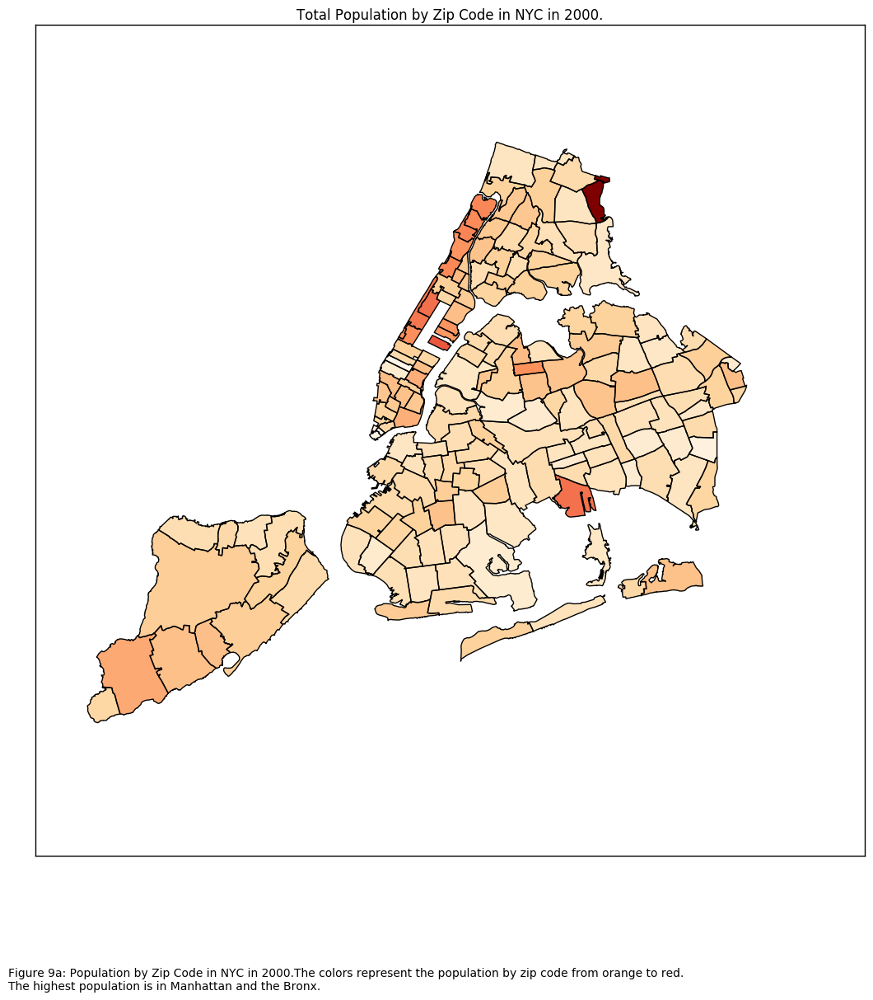

In [792]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
merged_agg_gdf.plot(column ='population2000', colormap ='OrRd', alpha = 1, linewidth = 1, ax = ax)

pl.title("Total Population by Zip Code in NYC in 2000.")
pl.figtext(0.1,0,"Figure 9a: Population by Zip Code in NYC in 2000."
"The colors represent the population by zip code from orange to red. \n"
"The highest population is in Manhattan and the Bronx.")

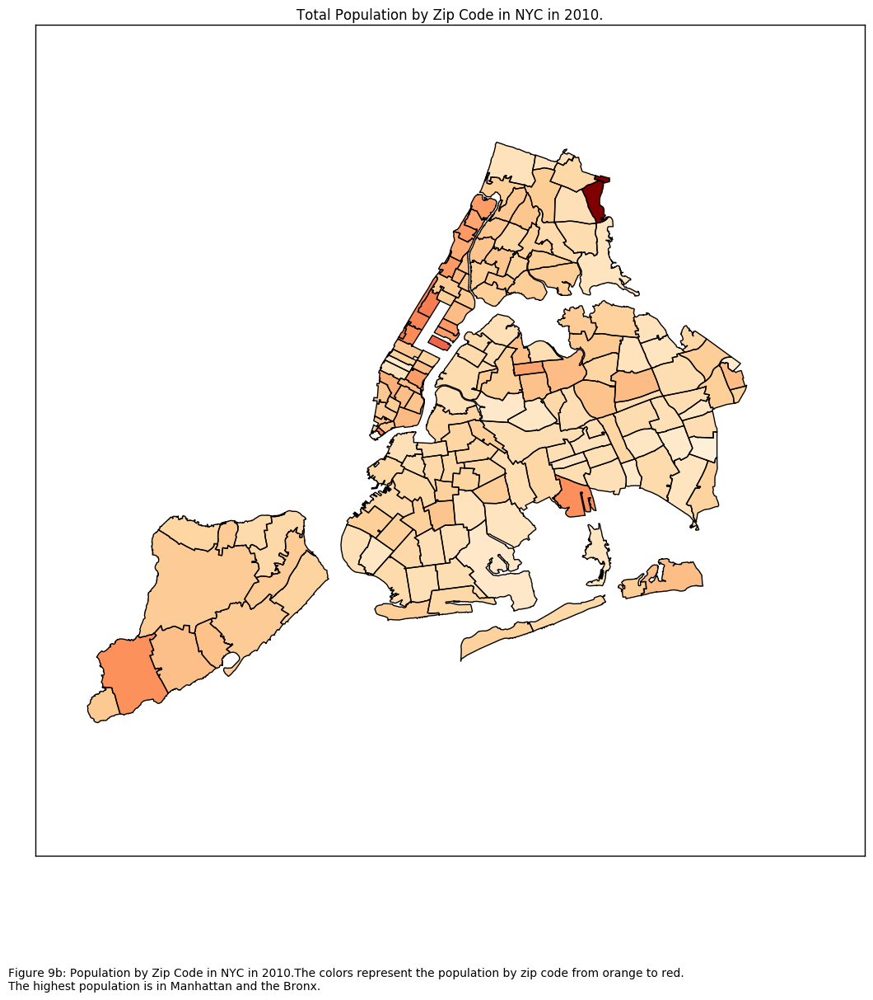

In [638]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
merged_agg_gdf.plot(column ='population2010', colormap ='OrRd', alpha = 1, linewidth = 1, ax = ax)

pl.title("Total Population by Zip Code in NYC in 2010.")
pl.figtext(0.1,0,"Figure 9b: Population by Zip Code in NYC in 2010."
"The colors represent the population by zip code from orange to red. \n"
"The highest population is in Manhattan and the Bronx.")

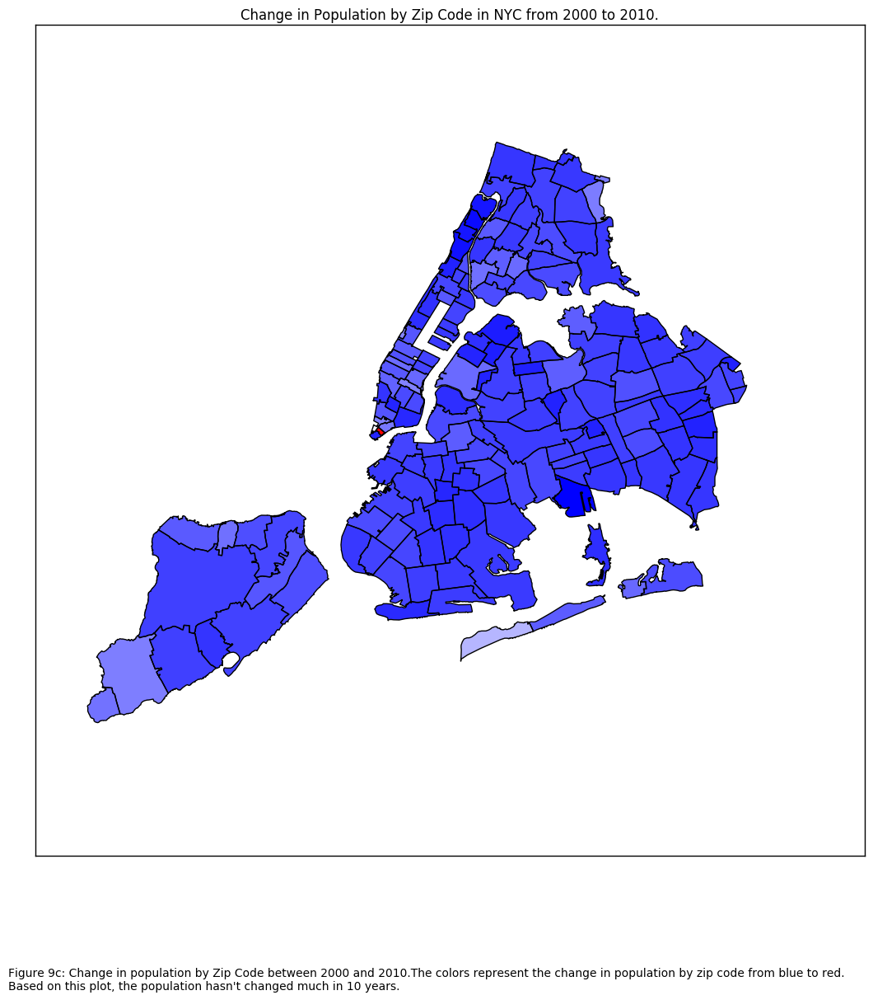

In [642]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
merged_agg_gdf.plot(column ='diff_population', colormap ='bwr', alpha = 1, linewidth = 1, ax = ax)

pl.title("Change in Population by Zip Code in NYC from 2000 to 2010.")
pl.figtext(0.1,0,"Figure 9c: Change in population by Zip Code between 2000 and 2010."
"The colors represent the change in population by zip code from blue to red. \n"
"Based on this plot, the population hasn't changed much in 10 years.")

#### To demonstrate the actual change in population in the plot above, we should normalize or use quantiles to dampen the effect of outliers.

### Plotting Median Age

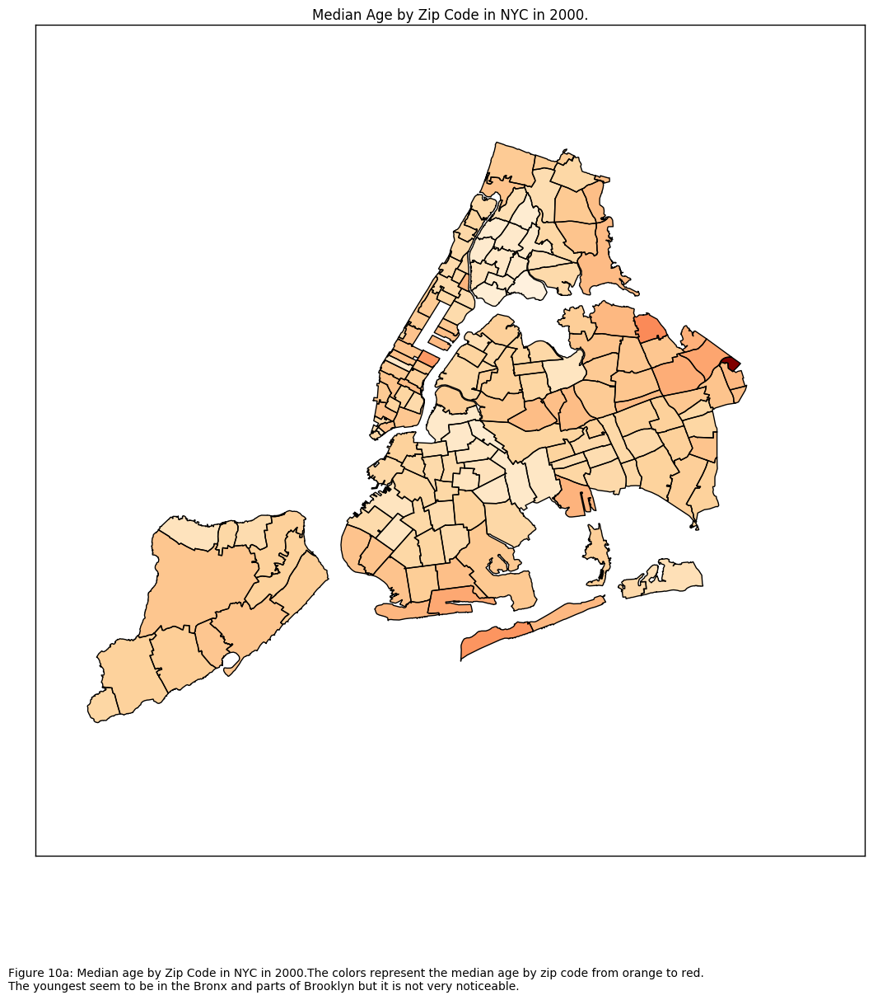

In [644]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
merged_agg_gdf.plot(column ='median_age2000', colormap ='OrRd', alpha = 1, linewidth = 1, ax = ax)

pl.title("Median Age by Zip Code in NYC in 2000.")
pl.figtext(0.1,0,"Figure 10a: Median age by Zip Code in NYC in 2000."
"The colors represent the median age by zip code from orange to red. \n"
"The youngest seem to be in the Bronx and parts of Brooklyn but it is not very noticeable.")

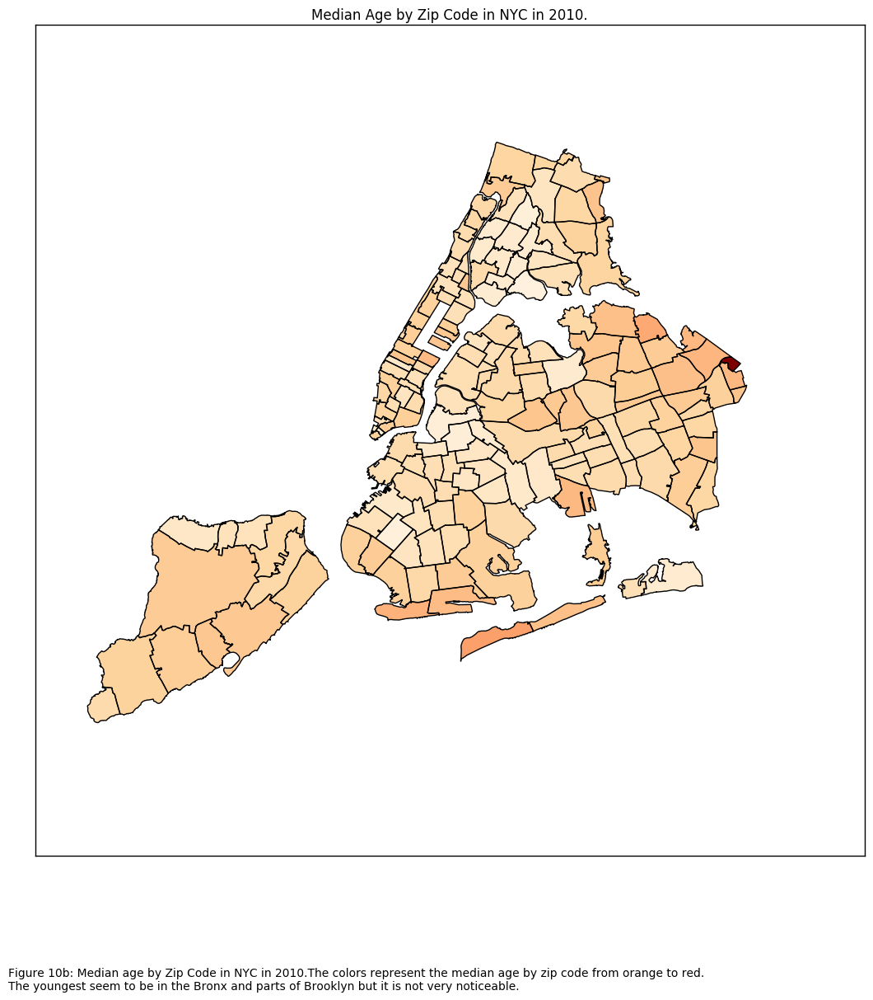

In [645]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
merged_agg_gdf.plot(column ='median_age2010', colormap ='OrRd', alpha = 1, linewidth = 1, ax = ax)

pl.title("Median Age by Zip Code in NYC in 2010.")
pl.figtext(0.1,0,"Figure 10b: Median age by Zip Code in NYC in 2010."
"The colors represent the median age by zip code from orange to red. \n"
"The youngest seem to be in the Bronx and parts of Brooklyn but it is not very noticeable.")

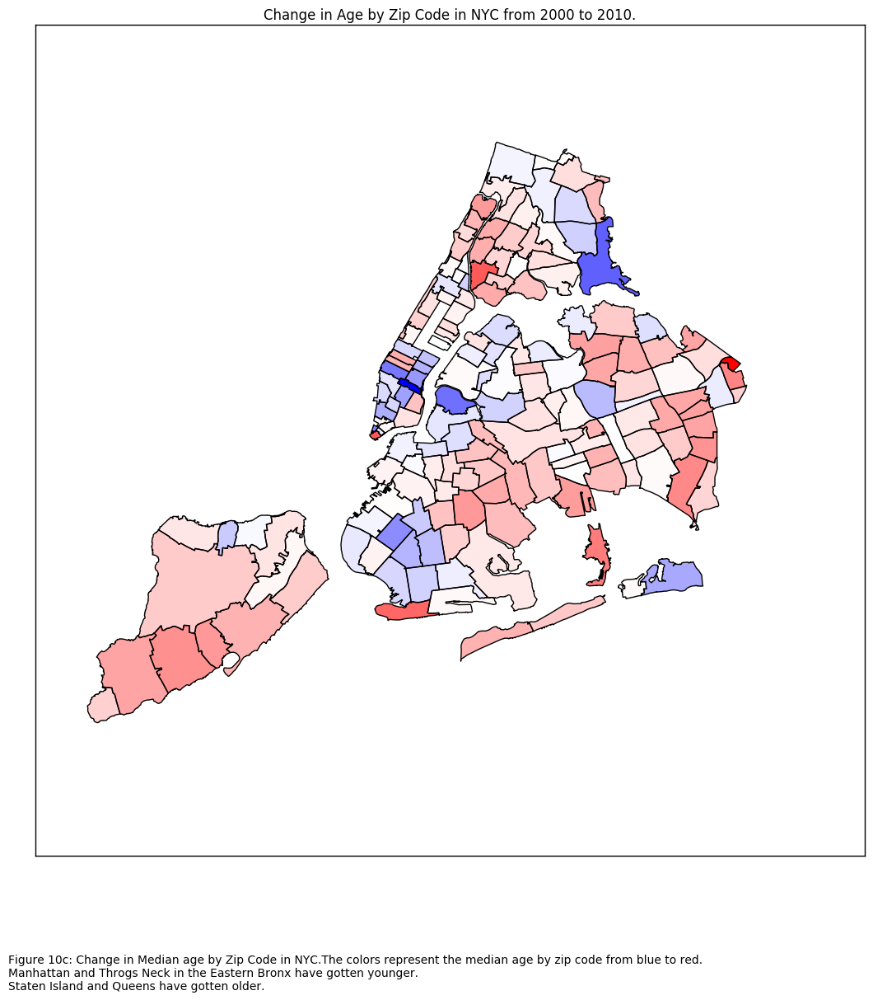

In [647]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
merged_agg_gdf.plot(column ='diff_age', colormap ='bwr', alpha = 1, linewidth = 1, ax = ax)

pl.title("Change in Age by Zip Code in NYC from 2000 to 2010.")
pl.figtext(0.1,0,"Figure 10c: Change in Median age by Zip Code in NYC."
"The colors represent the median age by zip code from blue to red. \n"
"Manhattan and Throgs Neck in the Eastern Bronx have gotten younger. \n"
"Staten Island and Queens have gotten older.")

## Plotting Diversity

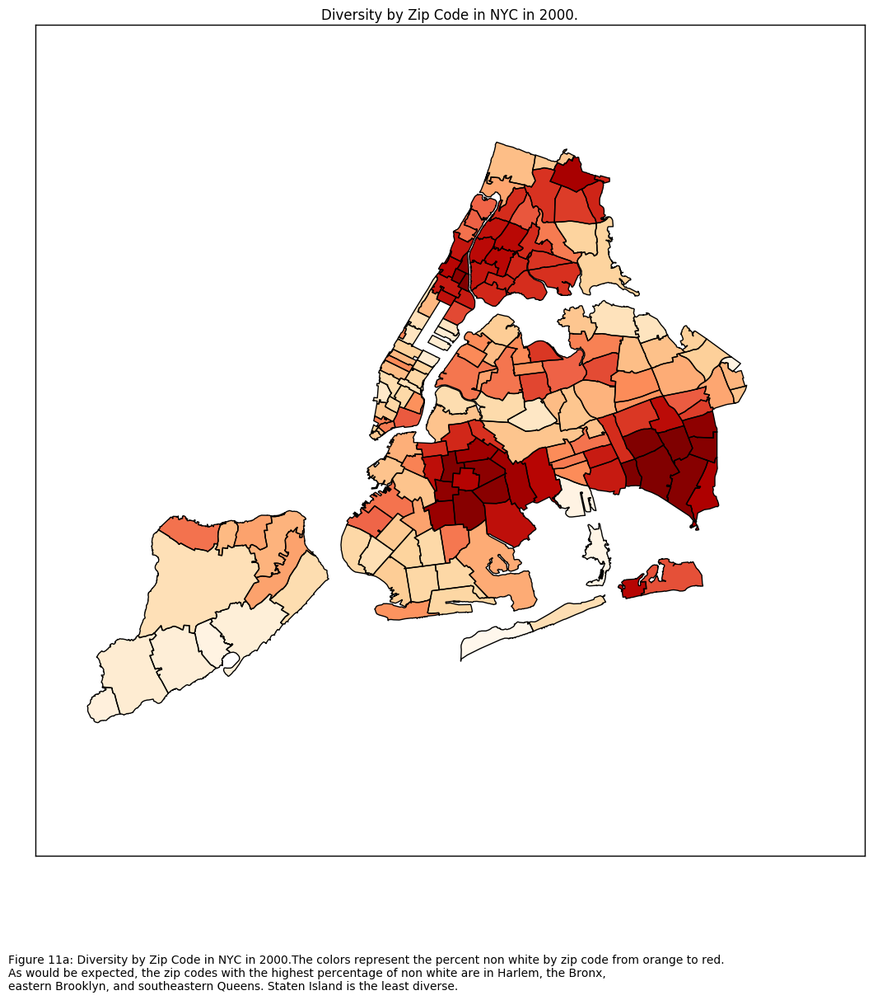

In [649]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
merged_agg_gdf.plot(column ='non_white2000', colormap ='OrRd', alpha = 1, linewidth = 1, ax = ax)

pl.title("Diversity by Zip Code in NYC in 2000.")
pl.figtext(0.1,0,"Figure 11a: Diversity by Zip Code in NYC in 2000."
"The colors represent the percent non white by zip code from orange to red. \n"
"As would be expected, the zip codes with the highest percentage of non white are in Harlem, the Bronx, \n"
"eastern Brooklyn, and southeastern Queens. Staten Island is the least diverse.")

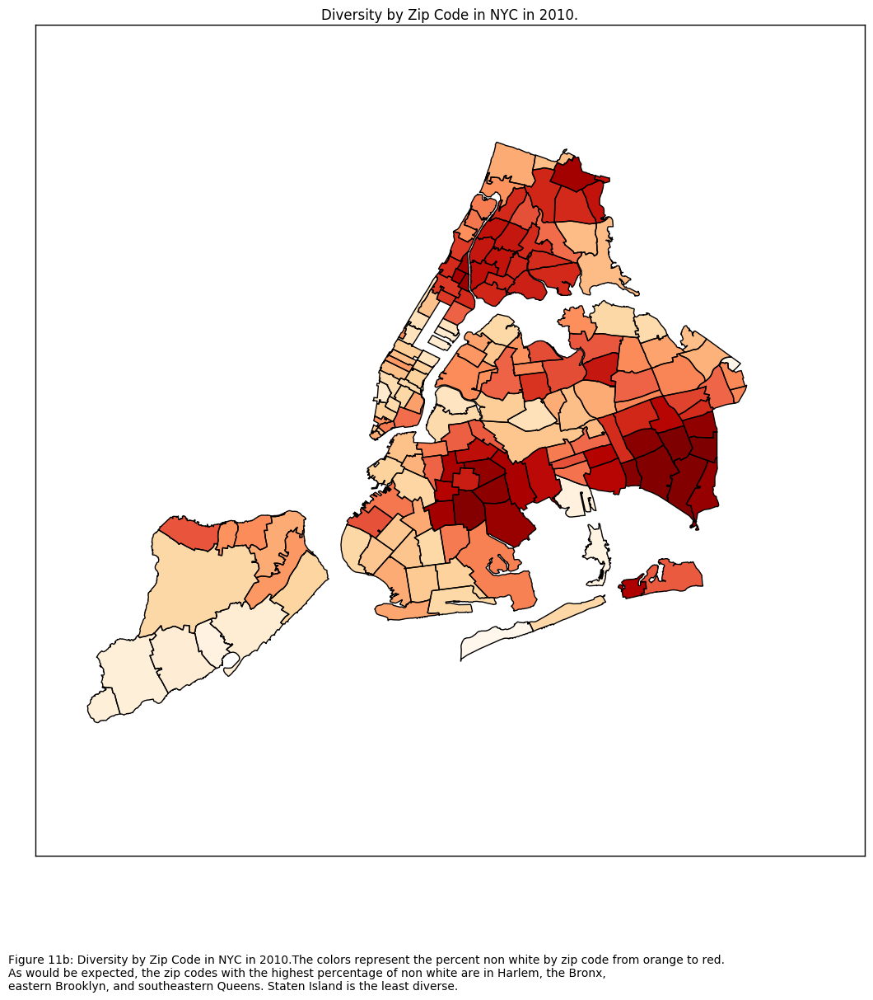

In [650]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
merged_agg_gdf.plot(column ='non_white2010', colormap ='OrRd', alpha = 1, linewidth = 1, ax = ax)

pl.title("Diversity by Zip Code in NYC in 2010.")
pl.figtext(0.1,0,"Figure 11b: Diversity by Zip Code in NYC in 2010."
"The colors represent the percent non white by zip code from orange to red. \n"
"As would be expected, the zip codes with the highest percentage of non white are in Harlem, the Bronx, \n"
"eastern Brooklyn, and southeastern Queens. Staten Island is the least diverse.")

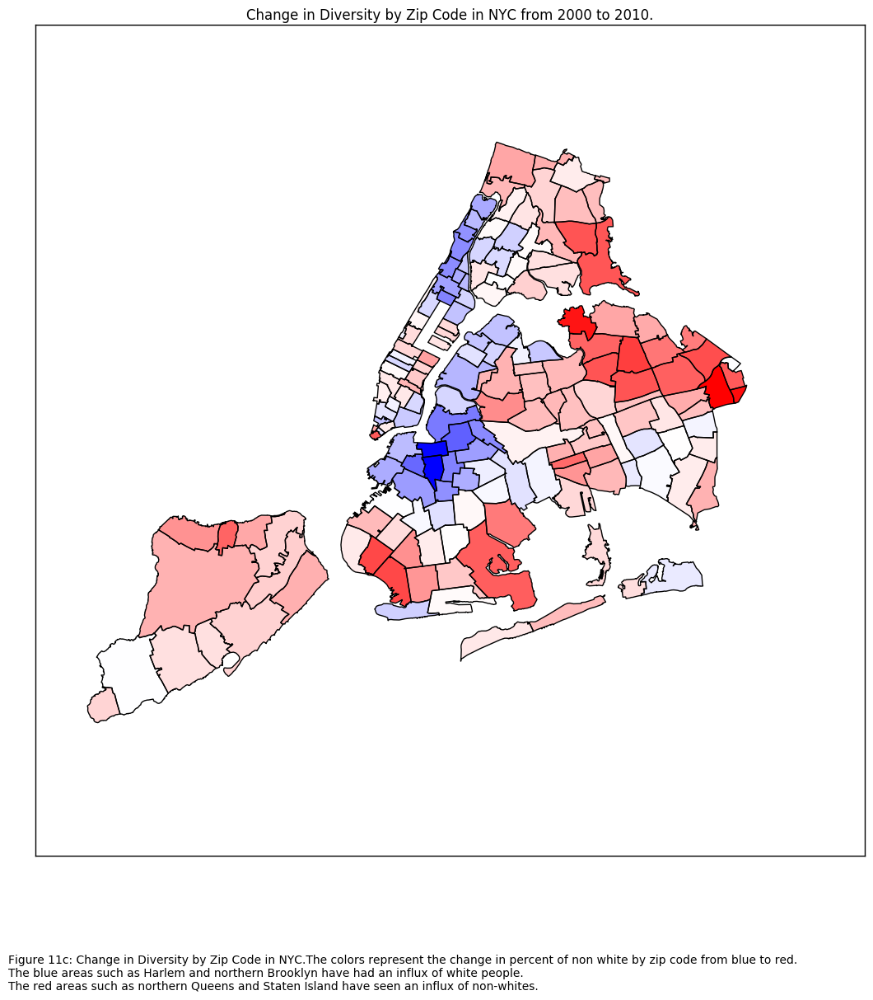

In [652]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
merged_agg_gdf.plot(column ='diff_non_white', colormap ='bwr', alpha = 1, linewidth = 1, ax = ax)

pl.title("Change in Diversity by Zip Code in NYC from 2000 to 2010.")
pl.figtext(0.1,0,"Figure 11c: Change in Diversity by Zip Code in NYC."
"The colors represent the change in percent of non white by zip code from blue to red. \n"
"The blue areas such as Harlem and northern Brooklyn have had an influx of white people. \n"
"The red areas such as northern Queens and Staten Island have seen an influx of non-whites.")

#### The plots above are consistent with the known patterns in NYC. Gentrification has been happening mostly in Harlem and northern Brooklyn, which has brought more white people to areas that were predominantly Afriacn-American and Hispanic. On the other side, there has been an influx of people of color moving to Staten Island.

### Plotting Income

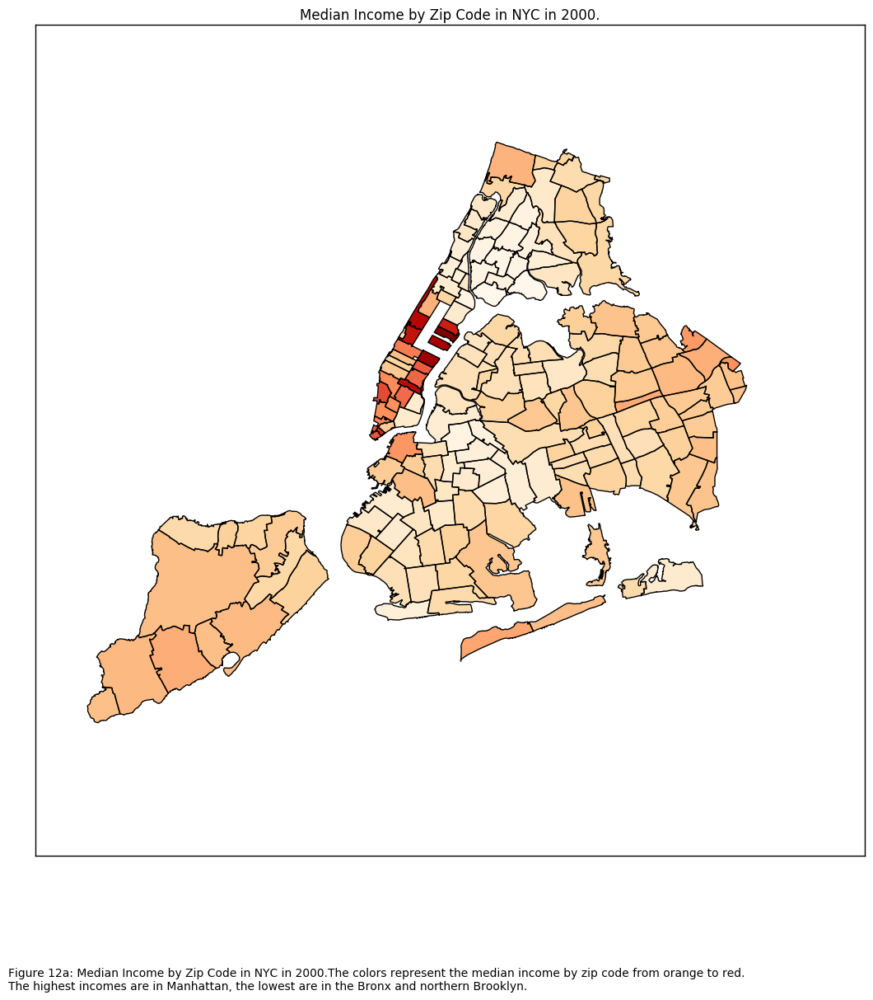

In [654]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
merged_agg_gdf.plot(column ='median_income2000', colormap ='OrRd', alpha = 1, linewidth = 1, ax = ax)

pl.title("Median Income by Zip Code in NYC in 2000.")
pl.figtext(0.1,0,"Figure 12a: Median Income by Zip Code in NYC in 2000."
"The colors represent the median income by zip code from orange to red. \n"
"The highest incomes are in Manhattan, the lowest are in the Bronx and northern Brooklyn.")

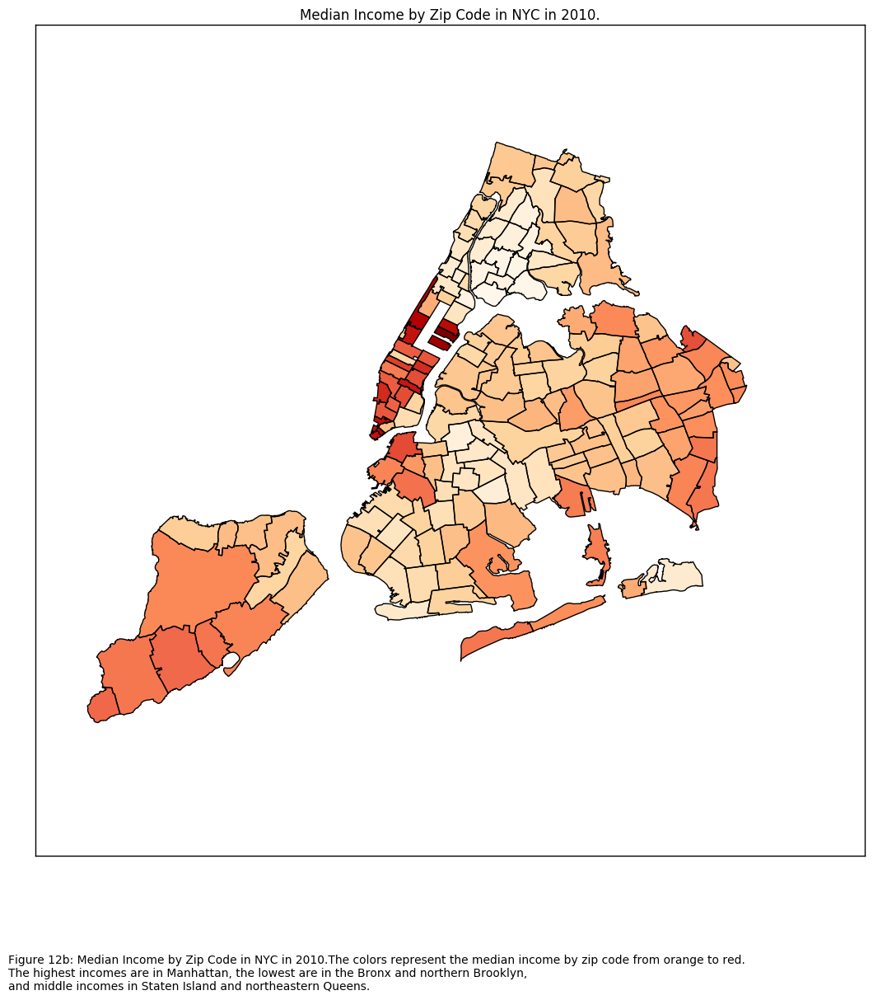

In [656]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
merged_agg_gdf.plot(column ='median_income2010', colormap ='OrRd', alpha = 1, linewidth = 1, ax = ax)

pl.title("Median Income by Zip Code in NYC in 2010.")
pl.figtext(0.1,0,"Figure 12b: Median Income by Zip Code in NYC in 2010."
"The colors represent the median income by zip code from orange to red. \n"
"The highest incomes are in Manhattan, the lowest are in the Bronx and northern Brooklyn, \n"
"and middle incomes in Staten Island and northeastern Queens.")

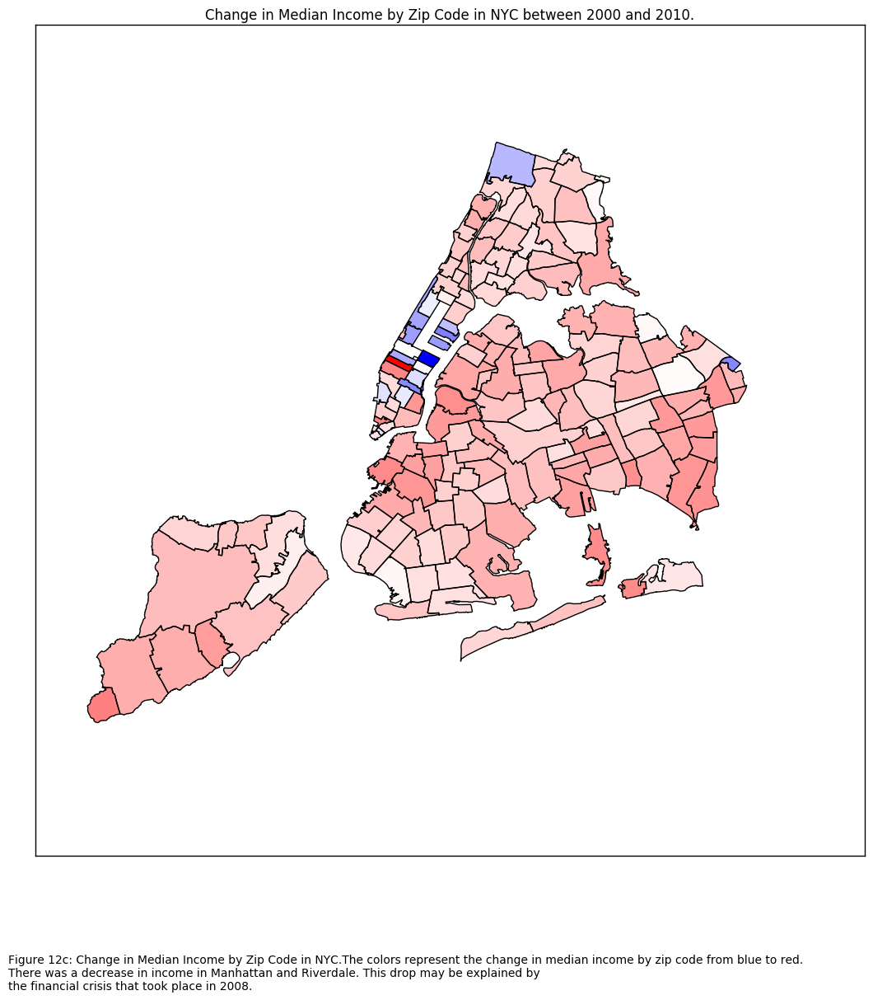

In [659]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
merged_agg_gdf.plot(column ='diff_income', colormap ='bwr', alpha = 1, linewidth = 1, ax = ax)

pl.title("Change in Median Income by Zip Code in NYC between 2000 and 2010.")
pl.figtext(0.1,0,"Figure 12c: Change in Median Income by Zip Code in NYC."
"The colors represent the change in median income by zip code from blue to red. \n"
"There was a decrease in income in Manhattan and Riverdale. This drop may be explained by \n"
"the financial crisis that took place in 2008.")

#### I am not plotting the business density again since those plots were done in question 3.

### Cluster at the zip code level

In [688]:
#Create clusters for 2000 data
zip2000 = merged_agg_gdf[['zip_code', '2000_density', 'population2000', 'non_white2000', 'median_age2000', 'median_income2000']]

In [665]:
zip2000['2000_density'] = whiten(zip2000['2000_density'])
zip2000['population2000'] = whiten(zip2000['population2000'])
zip2000['non_white2000'] = whiten(zip2000['non_white2000'])
zip2000['median_age2000'] = whiten(zip2000['median_age2000'])
zip2000['median_income2000'] = whiten(zip2000['median_income2000'])

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usin

In [666]:
columns2000 = ['2000_density', 'population2000', 'non_white2000', 'median_age2000', 'median_income2000']

In [668]:
km2000_zip = KMeans(5, random_state = 444).fit(zip2000[columns2000])

In [670]:
#choose the number of clusters
#Using code from http://www.dummies.com/programming/big-data/data-science
#/how-to-visualize-the-clusters-in-a-k-means-unsupervised-learning-model/
nc = 5

#cluster    
km2000_zip = KMeans(n_clusters = nc, random_state = 444).fit(zip2000[columns2000])
zip2000['cluster'] = km2000_zip.labels_

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [673]:
#Create clusters for 2010 data
zip2010 = merged_agg_gdf[['zip_code', '2010_density', 'population2010', 'non_white2010', 'median_age2010', 'median_income2010']]

In [675]:
zip2010['2010_density'] = whiten(zip2010['2010_density'])
zip2010['population2010'] = whiten(zip2010['population2010'])
zip2010['non_white2010'] = whiten(zip2010['non_white2010'])
zip2010['median_age2010'] = whiten(zip2010['median_age2010'])
zip2010['median_income2010'] = whiten(zip2010['median_income2010'])

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usin

In [676]:
columns2010 = ['2010_density', 'population2010', 'non_white2010', 'median_age2010', 'median_income2010']

km2010_zip = KMeans(5, random_state = 444).fit(zip2010[columns2010])

In [677]:
#choose the numbe of clusters
nc = 5

#cluster    
km2010_zip = KMeans(n_clusters = nc, random_state = 444).fit(zip2010[columns2010])
zip2010['cluster'] = km2010_zip.labels_

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [679]:
#merge with 2000 cluster
merged_agg_gdf = pd.merge(merged_agg_gdf , zip2000[['zip_code', 'cluster']], on= 'zip_code', how='inner')

In [681]:
#merge with 2010 cluster
merged_agg_gdf = pd.merge(merged_agg_gdf , zip2010[['zip_code', 'cluster']], on= 'zip_code', how='inner')

In [684]:
#rename the functions
merged_agg_gdf = merged_agg_gdf.rename(
    columns={'cluster_x': 'cluster2000', 'cluster_y': 'cluster2010'})

In [687]:
#Add a field to indicate if the zip code changed clusters
merged_agg_gdf['same'] = (merged_agg_gdf['cluster2000'].values == merged_agg_gdf['cluster2010'].values)

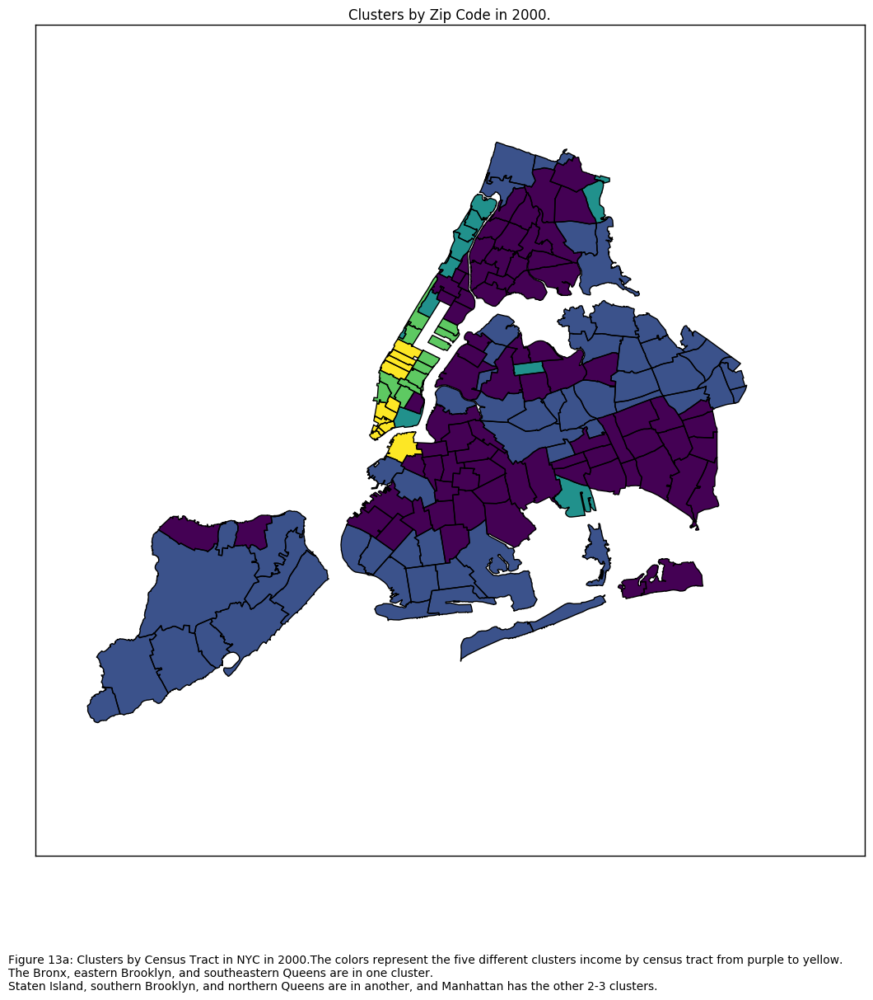

In [690]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

merged_agg_gdf.plot(column ='cluster2000', colormap ='viridis', alpha = 1, linewidth = 1, ax = ax)
pl.title("Clusters by Zip Code in 2000.")
pl.figtext(0.1,0,"Figure 13a: Clusters by zip code in NYC in 2000."
"The colors represent the five different clusters by zip code from purple to yellow. \n"
"The Bronx, eastern Brooklyn, and southeastern Queens are in one cluster. \n"
"Staten Island, southern Brooklyn, and northern Queens are in another, and Manhattan has the other 2-3 clusters.")

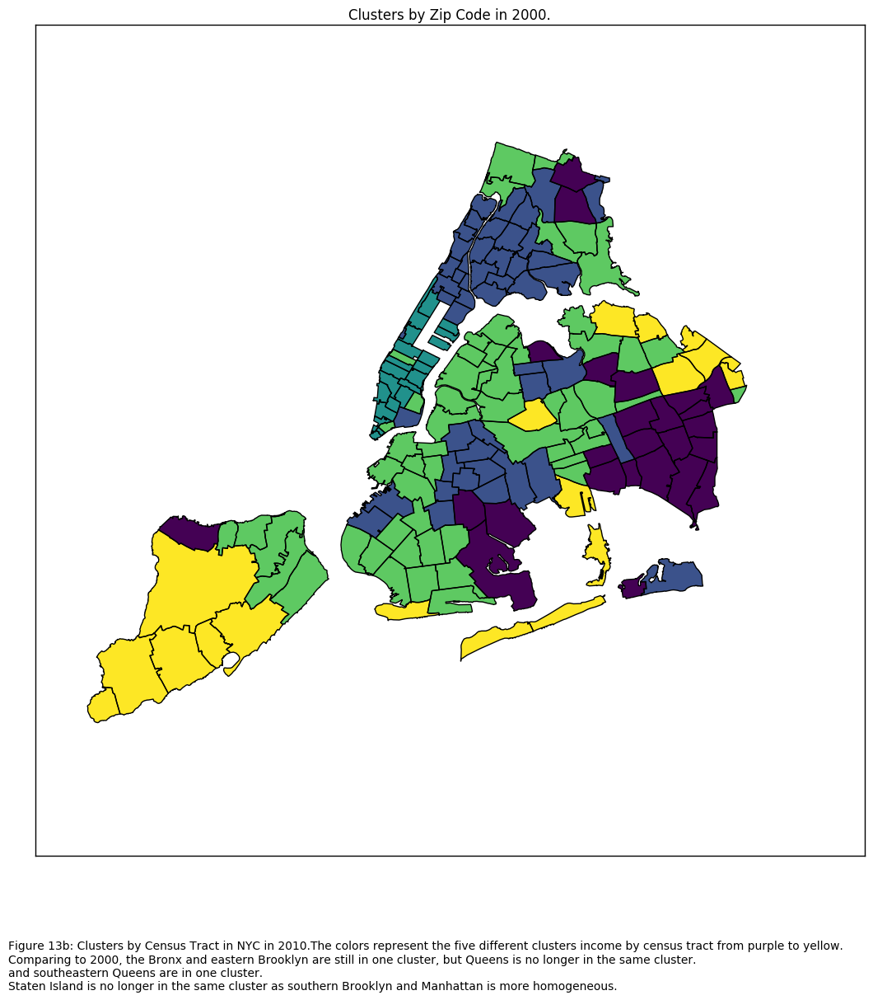

In [692]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

merged_agg_gdf.plot(column ='cluster2010', colormap ='viridis', alpha = 1, linewidth = 1, ax = ax)
pl.title("Clusters by Zip Code in 2000.")
pl.figtext(0.1,0,"Figure 13b: Clusters by zip code in NYC in 2010."
"The colors represent the five different clusters by zip code from purple to yellow. \n"
"Comparing to 2000, the Bronx and eastern Brooklyn are still in one cluster, but Queens is no longer in the same cluster. \n"
"and southeastern Queens are in one cluster. \n"
"Staten Island is no longer in the same cluster as southern Brooklyn and Manhattan is more homogeneous.")

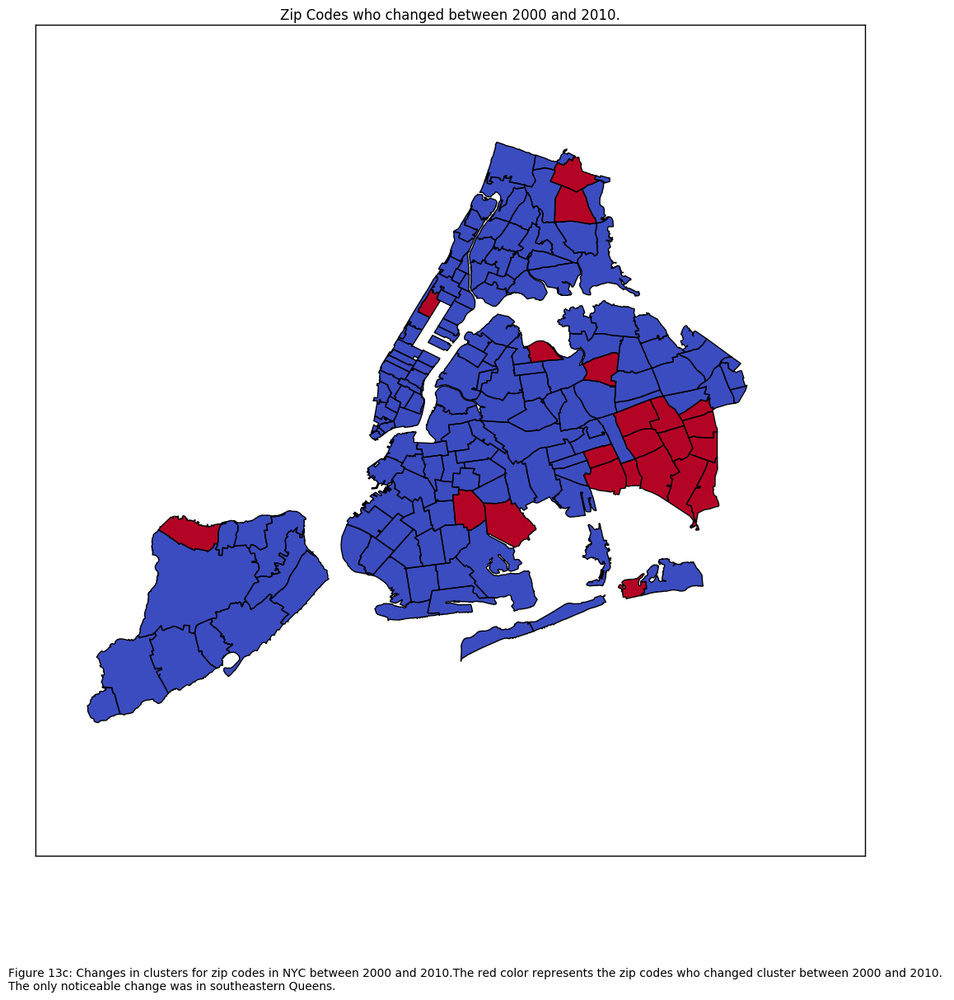

In [696]:
f, ax = pl.subplots(figsize=(13,13))
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

merged_agg_gdf.plot(column ='same', colormap ='coolwarm', alpha = 1, linewidth = 1, ax = ax)
pl.title("Zip Codes who changed between 2000 and 2010.")
pl.figtext(0.1,0,"Figure 13c: Changes in clusters for zip codes in NYC between 2000 and 2010."
"The red color represents the zip codes who changed cluster between 2000 and 2010. \n"
"The only noticeable change was in southeastern Queens.")

### 13. This was a very interesting analysis and gave me an opportunity to look at neighborhoods throughout the city across several characteristics. Some patterns could be seen in every plot. The Bronx and eastern Brooklyn share many characteristics such as high levels of diversity, lower income, and a younger population. Staten Island, south Brooklyn and parts of Queens seem to be in the middle for most features. Manhattan, especially midtown, is an outlier for income and for business density.

### Further analysis would be to investigate how these features have changed with each other and which ones are corelated.